<a href="https://colab.research.google.com/github/ebitnet65/QuDPi/blob/main/nonlinear_Spano_complex.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install qutip;

### This code is a bit chunky as it is a working draft. Once finalized, I will replace the redundant parts with properly programmed functions.

In [ ]:
from qutip import *
import numpy as np
import matplotlib.pyplot as plt

**Defining System Hamiltonian:**

$$
H = \hbar\omega_1 a^\dagger_1 a_1 + \hbar\omega_2 a^\dagger_2 a_2 + J(a^\dagger_1 a_2 + a^\dagger_2 a_1)+\hbar\Omega_1 b^\dagger_1 b_1+ \hbar\Omega_2 b^\dagger_2 b_2 + \hbar\Omega_1 S_1 a^\dagger_1 a_1(b^\dagger_1 + b_1)+ \hbar\Omega_2 S_2 a^\dagger_2 a_2(b^\dagger_2 + b_2) 
$$

where $a^\dagger, a$ are local excitations with exchange coupling $J$,
$b^\dagger,b$ are the phonon operators, and $S$ are the Huang-Rhys factors.

*Parameters:*  $\omega_{1,2}= 2eV$, $J = 15meV$, $\Omega_{1,2} = 200 meV$ and $S_{1,2} = 1$

**Light-Matter coupling:** $$ \hat\mu = \hat\mu_1 +\hat\mu_2 = \mu_1 (a_1^\dagger + a_1) + \mu_2(a_2^\dagger + a_2)
$$

Taking $\mu_{1,2} = \mu = 1$

Further defining dephasing for $a_i$ and relaxation for $b_i$ 

**The brute force approach**

As a simple brute force approach, allow all sub systems (2 excitonic and 2 phononic) to be 2 level systems.

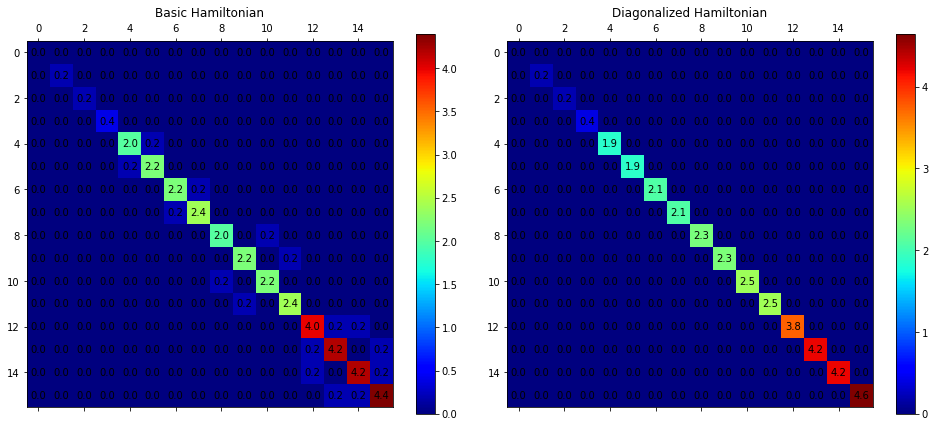

In [ ]:
hbar = 0.65821195107 # eV fs
h = 4.13566766 # eV fs
#energy = hbar*omega = h*freq
# freq = energy/h
# omega = energy/hbar
# omega = 2*pi*f 
n=2 # levels in excitonic sub-systems
m=2 # levels in phononic sub-systems
a1 = tensor(destroy(n), qeye(n), qeye(m), qeye(m))
a2 = tensor(qeye(n), destroy(n), qeye(m), qeye(m))
b1 = tensor(qeye(n), qeye(n), destroy(m), qeye(m))
b2 = tensor(qeye(n), qeye(n), qeye(m), destroy(m))
w = 2/hbar # 2*pi/fs = 2*pi*peta hertz = PHz; w = 2*pi*f
j = 0.015/hbar # coupling in 2*pi/fs
W1 = W2 = 0.2/hbar # phonon Omega in 2*pi/fs
He = hbar*(w*a1.dag()*a1 + w*a2.dag()*a2 + j*(a1.dag()*a2 + a1*a2.dag()))
Hp = hbar*(W1*b1.dag()*b1 + W2*b2.dag()*b2)
S = 1 # Huang-Rhys factor
Hep = hbar*(S*W1*(b1+b1.dag())*a1.dag()*a1 + S*W2*(b2+b2.dag())*a2.dag()*a2)
mu = 1
u1 = mu*(a1.dag()+a1)
u2 = mu*(a2.dag()+a2)
u = u1+u2
H = He+Hp+Hep
eigen_energies, eigen_states = H.eigenstates()
H_diag = H.transform(eigen_states)

############ plotting the matrices ################
def plot_matrices(He, He_diag, labels=['Basic Hamiltonian', 'Diagonalized Hamiltonian'], figsize=(14, 6)):
  fig, axs = plt.subplots(1, 2, figsize=figsize)
  fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, top=0.94, wspace=0.05)
  im0 = axs[0].matshow(np.real(He), cmap='jet')
  im1 = axs[1].matshow(np.real(He_diag), cmap='jet')
  plt.colorbar(im0, ax=axs[0])
  plt.colorbar(im1, ax=axs[1])
  axs[0].set_title(labels[0])
  for (i, j), z in np.ndenumerate(np.real(He)):
      axs[0].text(j, i, '{:0.1f}'.format(z), ha='center', va='center')
  axs[1].set_title(labels[1])
  for (i, j), z in np.ndenumerate(np.real(He_diag)):
      axs[1].text(j, i, '{:0.1f}'.format(z), ha='center', va='center')
  #fig.suptitle('H exciton')
  plt.show()
  return None
plot_matrices(H, H_diag, labels=['Basic Hamiltonian', 'Diagonalized Hamiltonian'], figsize=(14, 6))

##The Excitonic Hamiltonian

Focusing only on the excitonic part to understand the changes during diagonalization; and tracking the transormation of dipole and other relevant operators.

This will lead to a better understanding about what to expect in perturbative expansion for nonlinear spectral response


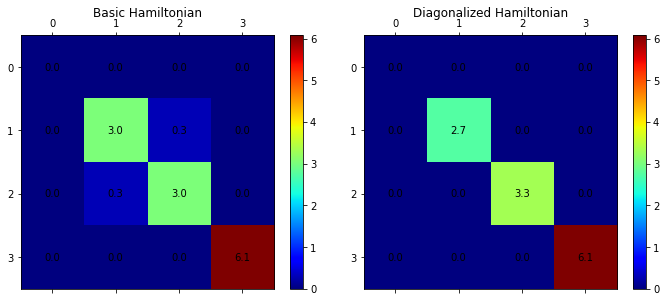

In [ ]:
hbar = 0.65821195107 # eV fs
h = 4.13566766 # eV fs
#energy = hbar*omega = h*freq
# freq = energy/h
# omega = energy/hbar
# omega = 2*pi*f 
n=2 # levels in excitonic sub-systems
m=2 # levels in phononic sub-systems
a1 = tensor(destroy(n), qeye(n))
a2 = tensor(qeye(n), destroy(n))
w = 2/hbar # 2*pi/fs = 2*pi*peta hertz = PHz; w = 2*pi*f
j = 0.2/hbar # coupling in 2*pi/fs
He = w*a1.dag()*a1 + w*a2.dag()*a2 + j*(a1.dag()*a2 + a1*a2.dag())
mu = 1
u1 = mu*(a1.dag()+a1)
u2 = mu*(a2.dag()+a2)
u = u1+u2

eigen_energies, eigen_states = He.eigenstates()
He_diag = He.transform(eigen_states)
plot_matrices(He, He_diag, figsize=(10,4))

In [ ]:
eigen_states

array([Quantum object: dims = [[2, 2], [1, 1]], shape = (4, 1), type = ket
       Qobj data =
       [[1.]
        [0.]
        [0.]
        [0.]]                                                             ,
       Quantum object: dims = [[2, 2], [1, 1]], shape = (4, 1), type = ket
       Qobj data =
       [[ 0.        ]
        [ 0.70710678]
        [-0.70710678]
        [ 0.        ]]                                                    ,
       Quantum object: dims = [[2, 2], [1, 1]], shape = (4, 1), type = ket
       Qobj data =
       [[0.        ]
        [0.70710678]
        [0.70710678]
        [0.        ]]                                                     ,
       Quantum object: dims = [[2, 2], [1, 1]], shape = (4, 1), type = ket
       Qobj data =
       [[0.]
        [0.]
        [0.]
        [1.]]                                                             ],
      dtype=object)

The original basis are 
$$
|system1, system2 \rangle = |00⟩, |01⟩, |10⟩, |11⟩
$$
The eigen states of for $H_e$ are 
$$
|v_0\rangle = |00⟩, |v_1\rangle = \frac{|01⟩-|10⟩}{\sqrt{2}}, |v_2⟩ = \frac{|01⟩+|10⟩}{\sqrt{2}}, |v_3⟩ = |11⟩
$$
The eigen energies of $|v_1⟩$ annd $|v_2⟩$ are $ħ\omega-J$ and $ħ\omega+J$ respectively.

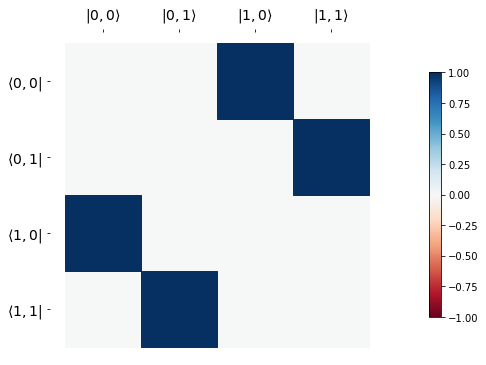

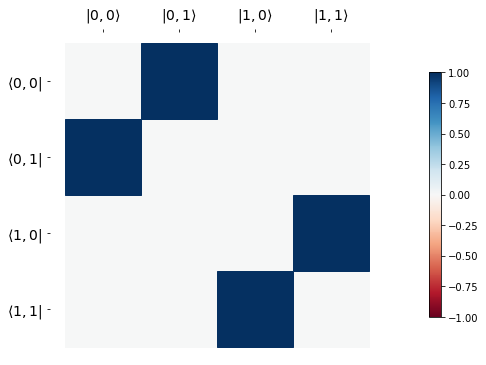

In [ ]:
# lets have a closer look at the dipole operators.
hinton(u1)
hinton(u2)
plt.show()

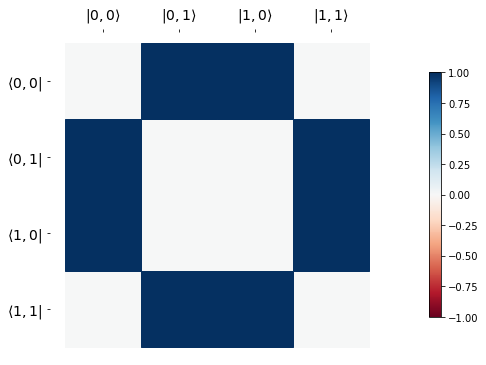

In [ ]:
#total dipole u = u1+u2
hinton(u)
plt.show()

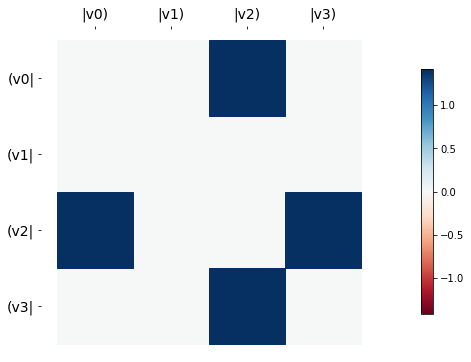

In [ ]:
#dipole in eigen basis
ut = u.transform(eigen_states)
hinton(ut, xlabels=['|v0)', '|v1)', '|v2)', '|v3)'], ylabels=['(v0|', '(v1|', '(v2|', '(v3|'])
plt.show()

#Points to Note:
1- The transformed dipole does not couple $|v_1⟩$ with any other state, hence it is a dark state.

2- The energy gap between dipole coupled states is not uniform anymore. For $|v_0⟩ \to |v_2⟩$ it is $ħ\omega + J$ and from $|v_2⟩ \to |v_3⟩$ it is $ħ\omega - J$.

3- The non-zero elements of density matrix are reduced from 8 to 4 during diagonalization. However, the elements of diagonalized density matrix are larger in magnitude ($\sqrt{2}$) than untransformed dipole. (Since the matrices are related by unitary transformation, therefore the l2 norm of the diple is conserved, i.e. $\Sigma_{ij} \mu_{ij}^2 = 8$

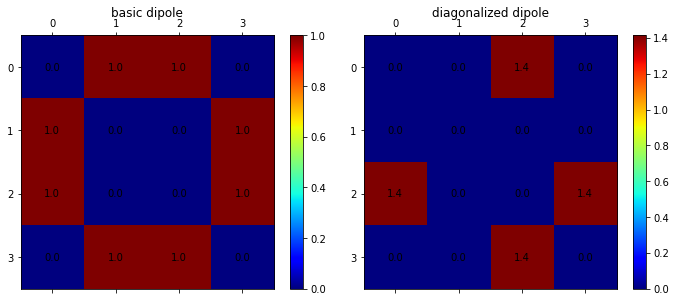

In [ ]:
plot_matrices(u, ut, ['basic dipole', 'diagonalized dipole'], (10, 4))

# Spectroscopic response
Calculating the $R^{(3)}_{1,2,3}(\tau, t)$ for $-k_1 + k_2 + k_3$ phase matching and $R^{(3)}_{4,5,6}(\tau, t)$ for $k_1-k_2+k_3$ phase matching. Remember $\tau$ is the delay between pulse 1 and 2 and $t$ is the time after pulse 3 (i.e. last pulse).

Note: The numbering of response terms is from Peter Hamm, Page 66.

In [ ]:
!apt-get install texlive-fonts-recommended;
!apt-get install dvipng;

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following packages were automatically installed and are no longer required:
  libnvidia-common-460 nsight-compute-2020.2.0
Use 'apt autoremove' to remove them.
The following additional packages will be installed:
  fonts-droid-fallback fonts-lmodern fonts-noto-mono fonts-texgyre
  libcupsfilters1 libcupsimage2 libgs9 libgs9-common libijs-0.35 libjbig2dec0
  libkpathsea6 libpotrace0 libptexenc1 libsynctex1 libtexlua52 libtexluajit2
  libzzip-0-13 lmodern poppler-data t1utils tex-common tex-gyre texlive-base
  texlive-binaries texlive-latex-base tipa
Suggested packages:
  fonts-noto poppler-utils ghostscript fonts-japanese-mincho
  | fonts-ipafont-mincho fonts-japanese-gothic | fonts-ipafont-gothic
  fonts-arphic-ukai fonts-arphic-uming fonts-nanum debhelper gv
  | postscript-viewer perl-tk xpdf-reader | pdf-viewer
  texlive-fonts-recommended-doc texlive-latex-base-doc
The following NEW pa

In [ ]:
!pip install ufss;

     |████████████████████████████████| 87 kB 3.2 MB/s 
     |████████████████████████████████| 1.7 MB 29.1 MB/s 
     |████████████████████████████████| 2.6 MB 34.8 MB/s 
  Created wheel for pyx: filename=PyX-0.15-py3-none-any.whl size=434913 sha256=067c11bbd599470092d747f841f37f51e123246b7c7df7dc0f29f958df9dddb0
  Stored in directory: /root/.cache/pip/wheels/77/8f/fe/aa41325681fb75a82653adfb843b321073e572c264a5d0f8de
Successfully built pyx


In [ ]:
import numpy as np
import ufss
import os

In [ ]:
# DiagramGenerator class, or DG for short
DG = ufss.DiagramGenerator
# initialize the module
R3rd = DG() # DG takes a single key-word argument, which has the default value detection_type = 'polarization'
# DiagramAutomation needs to know the phase-matching/-cycling condition
R3rd.set_phase_discrimination([(0,1),(1,0),(1,0)]) # setting condition for rephasing diagrams R1,2,3
# Set the pulse durations for pulses 0,1,2 and the local oscillator
d0 = 2
d1 = 4
d2 = 4
dlo = 6
# Set the pulse intervals
t0 = np.array([-d0/2,d0/2])
t1 = np.array([-d1/2,d1/2])
t2 = np.array([-d2/2,d2/2])
tlo = np.array([-dlo/2,dlo/2])
all_pulse_intervals = [t0,t1,t2,tlo]

# These pulse intervals are given to DG by setting DG's efield_times attribute
R3rd.efield_times = all_pulse_intervals
time_ordered_diagrams_rephasing = R3rd.get_diagrams([0,100,200,200])
[R3, R1, R2] = time_ordered_diagrams_rephasing
rephasing = [R1, R2, R3]
#R3rd.display_diagrams(rephasing)


In [ ]:
# Now the non-rephasing diagrams
R3rd.set_phase_discrimination([(1,0),(0,1),(1,0)]) # setting condition for rephasing diagrams R1,2,3
time_ordered_diagrams_nonrephasing = R3rd.get_diagrams([0,100,200,200])
[R6, R4, R5] = time_ordered_diagrams_nonrephasing #note the order is R6, R4, R5
nonrephasing = [R4, R5, R6]
#R3rd.display_diagrams(nonrephasing)

In [ ]:
class System():
    """
    the system class defines the physical system through the construction and computation of model hamiltonian.
    the elements internal to this class are:
    n = total number of energy levels
    rho = density matrix of the system
    a = lowering operator
    u = dipole operator
    H = Hamiltonian of the system
    c_ops = collapse operators that connect the system to the bath
    e_ops = observalbes for which expectation values are required
    """
    hbar = 0.658211951 # eV fs
    h = 4.13566766 # eV fs
    E = 2 #eV
    f = E/h
    w = E/hbar #2*np.pi*f

    def __init__(self, n=None, H=None, rho=None, a=None, u=None, c_ops=None, e_ops=None, tlist=None):
      self.n = n if n is not None else 2 #maximum manifold
      self.rho = rho if rho is not None else fock_dm(self.n+1, 0) # starting density matrix
      self.a = a if a is not None else destroy(self.n+1) # lowering operator
      self.u = u if u is not None else self.a.dag()+self.a #dipole operator
      self.H = H if H is not None else self.hbar*self.w*self.a.dag()*self.a # hamiltonian
      self.c_ops = c_ops if c_ops is not None else [] #list of collapse operators
      self.e_ops = e_ops if e_ops is not None else [] #list of expectation values
      self.tlist = tlist if tlist is not None else []
        
    def diagramDonkey(self, tlist=None, diagrams=None, r=100000, evolve_after=False):
      """
      Computes evolution of the density matrix for a nonlinear spectroscopy using double sided diagrams
      Inputs: a list of arrival times, and double-sided diagrams (ufss diagramGenerator format) 
      and resolution (time steps per fs). Note, the first pulse must be at 0 for now
      Output: List of times and states
      """
      if tlist==None:
          print("Error: tlist not given")
          return None
      elif diagrams==None:
          print("Error: diagrams not given")
          return None
        
        ##setting up simulation
      ##########################################################################################################
        
      states = []
      total_diagrams, total_interactions, c = np.shape(diagrams)
      #print('total diagrams', total_diagrams, ', total interactions ', total_interactions, ', subsystems', c-1)
      options = Options(nsteps=r)

      for diag in range(total_diagrams): #loop over diagrams
          #print('calculating diagram ', diag)
          rho = self.rho # setting starting density matrix typically the ground state
          #Iterating over pulses
          for pulse in range(len(tlist)-1): # loop over the  pulses
              # NOTE: the number of pulses is defined by arrival times-1
              #print('applying pulse #', pulse,' interactions')
              for x in diagrams[diag]: 
                  if x[1]==pulse:
                      #print(x[0])
                      if x[0]=='Ku':
                          rho = (self.a.dag()*rho).unit()
                      elif x[0]=='Bu':
                          rho = (rho*self.a).unit()
                      elif x[0]=='Kd':
                          rho = (self.a*rho).unit()
                      elif x[0]=='Bd':
                          rho = (rho*self.a.dag()).unit()
              #print('evolve state after pulse ', pulse)
              #print('mesolve tlist times ',[tlist[pulse], tlist[pulse+1]])
              results = mesolve(self.H,rho,[tlist[pulse], tlist[pulse+1]],self.c_ops,[], options=options)
              rho = results.states[-1]
          states.append(rho)
      return states

######################################################################################################
    def response2D(self, diagram, tau1, tau2, tau3, r=100, parallel=False):
      """
      computes just the third order response for a single diagram. 
      It can parallelized if resources are available
      """
      t1=0
      coh1_time = np.linspace(0,tau1,tau1*r)
      rho = self.rho
      x = diagram[0] # first pulse interaction
      print('appling first pulse at t1=0')
      rho = self.apply_pulse(rho, x) 
      print('evolve state after first pulse ')
      results = mesolve(self.H, rho, coh1_time, self.c_ops, [])
      states1 = results.states #collection of all states before second interaction
      #print('states after first coherence ', states1[-1])
      x = diagram[1]
      pop_time = np.linspace(0, tau2, tau2*r)
      #print(states1[-1])
      print('applying 2nd pulse and evolving the population for fixed time')
      if parallel:
        from qutip import parallel as pp
        self.tlist = pop_time
        states1 = pp.parfor(self.para_mesolve2, states1, x=x, only_last_state=True)
        #print(states1[-1])
      else:
        for i in range(len(states1)):
            state = self.apply_pulse(states1[i], x)
            result = mesolve(self.H, state, pop_time+coh1_time[i], self.c_ops, []) #+coh1_time[i]
            state = result.states[-1] #collecting only the last state
            states1[i] = state
      #print('states after pop ', states1[-1])
      #at this point we have a whole list of states, which will act as initial state for final evolution 
      print('applying 3rd pulse and evolving afterwards')
      x = diagram[2]
      coh2_time = np.linspace(0,tau3, tau3*r)
      final_states = []
        
      if parallel:
        self.tlist = coh2_time
        final_states.append(pp.parfor(self.para_mesolve2, states1, x=x, only_last_state=False))
        return final_states[0]
      else:
          for i in range(len(states1)):
            state = self.apply_pulse(states1[i], x)
            result = mesolve(self.H, state, coh2_time+tau2+coh1_time[i], self.c_ops, [])#+tau2+coh1_time[i]
            final_states.append(result.states) #collecting all the states
      #print('final states ', final_states[-1][-1])
          return final_states
################ some small functions to keep the main code readable      
    def apply_pulse(self, rho, x):
      if x[0]=='Ku':
          rho = (self.a.dag()*rho)#.unit()
      elif x[0]=='Bu':
          rho = (rho*self.a)#.unit()
      elif x[0]=='Kd':
          rho = (self.a*rho)#.unit()
      elif x[0]=='Bd':
          rho = (rho*self.a.dag())#.unit()
      return rho

    def para_mesolve2(self, rho, tlist=None, x=None, only_last_state=True):
        rho = self.apply_pulse(rho, x)
        if only_last_state:
            return mesolve(self.H, rho, self.tlist, self.c_ops, []).states[-1]
        else:
            return mesolve(self.H, rho, self.tlist, self.c_ops, []).states

In [ ]:
sys1 = System(n=2) # defining a copy of system class with upto doubly excited manifold
r=1 #time resolution in steps per fs.
t1=0 # arrival time of first pulse
tau1 = 200 # Maximum time delay between first two pulses in fs
tau2 = 20 # population time in fs
tau3 = 200 # Maximum time delay between last pulse and detection pulse

In [ ]:
statesR1 = sys1.response2D(R1, tau1, tau2, tau3, r)#, True) #computing the states' evolution for double-sided diagram
statesR2 = sys1.response2D(R2, tau1, tau2, tau3, r)#, True)
statesR3 = sys1.response2D(R3, tau1, tau2, tau3, r)#, True)
statesR4 = sys1.response2D(R4, tau1, tau2, tau3, r)#, True)
statesR5 = sys1.response2D(R5, tau1, tau2, tau3, r)#, True)
statesR6 = sys1.response2D(R6, tau1, tau2, tau3, r)#, True)
qsave(statesR1, 'stateR1_r2')
qsave(statesR2, 'stateR2_r2')
qsave(statesR3, 'stateR3_r2')
qsave(statesR4, 'stateR4_r2')
qsave(statesR5, 'stateR5_r2')
qsave(statesR6, 'stateR6_r2')

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


In [ ]:
uuR1 = np.array([expect(sys1.u, statesR1[x][:]) for x in range(len(statesR1))])
uuR2 = np.array([expect(sys1.u, statesR2[x][:]) for x in range(len(statesR2))])
uuR3 = np.array([expect(sys1.u, statesR3[x][:]) for x in range(len(statesR3))])
uuR4 = np.array([expect(sys1.u, statesR4[x][:]) for x in range(len(statesR4))])
uuR5 = np.array([expect(sys1.u, statesR5[x][:]) for x in range(len(statesR5))])
uuR6 = np.array([expect(sys1.u, statesR6[x][:]) for x in range(len(statesR6))])
uu_list = [uuR1, uuR2, uuR3, uuR4, uuR5, uuR6]
qsave(uuR1, 'uuR1_r2')
qsave(uuR2, 'uuR2_r2')
qsave(uuR3, 'uuR3_r2')
qsave(uuR4, 'uuR4_r2')
qsave(uuR5, 'uuR5_r2')
qsave(uuR6, 'uuR6_r2')

In [ ]:
def plotAll(sig, extent, scale='linear', interpolation='spline36', title=None):
    ''' A dedicated function for plotting the R1 through R6 response terms in 3rd order spectroscopy
    Inputs: 
    sig = a list/numpy array of R matrices, 
    extent = the min and max of axes in matplotlib imshow format.
    scale = is the color scale, default is linear, but it can be set to log.
    interpolartion = interpolation method, use 'none' if interpolation is not desired.
    
    Outputs: None, just displays the plots using matplotlib imshow
    '''
    if scale=='log': 
        sig = np.array([log_scale(s.real) for s in sig])
    fig, axs = plt.subplots(2, 3, figsize=(12,8))
    fig.subplots_adjust(left=0.02, bottom=0.06, right=1, top=0.94, wspace=0.05)
    if title: fig.suptitle(title)
    im00 = axs[0,0].imshow(sig[0], origin='lower', interpolation=interpolation, extent=extent)
    im01 = axs[0,1].imshow(sig[1], origin='lower', interpolation=interpolation, extent=extent)
    im02 = axs[0,2].imshow(sig[2], origin='lower', interpolation=interpolation, extent=extent)
    im10 = axs[1,0].imshow(sig[3], origin='lower', interpolation=interpolation, extent=extent)
    im11 = axs[1,1].imshow(sig[4], origin='lower', interpolation=interpolation, extent=extent)
    im12 = axs[1,2].imshow(sig[5], origin='lower', interpolation=interpolation, extent=extent)
    plt.colorbar(im02, ax=axs[0,2])
    plt.colorbar(im12, ax=axs[1,2])
    axs[0,0].set_title('R1')
    axs[0,1].set_title('R2')
    axs[0,2].set_title('R3')
    axs[1,0].set_title('R4')
    axs[1,1].set_title('R5')
    axs[1,2].set_title('R6')
    plt.show()
    return None

def log_scale(z):
    ''' 
    Simple function for rescaling the 2D input matrix to log scale.
    Warning: the numbers between -1 and 1 are mapped to zero.
    '''
    x,y = np.shape(z)
    for n in range(x):
        for m in range(y):
            if z[n,m] >= 1:
                z[n,m] = np.log(z[n,m])
            elif z[n,m] <= -1:
                z[n,m] = -np.log(-z[n,m])
            else:
                z[n,m] = 0
    return z

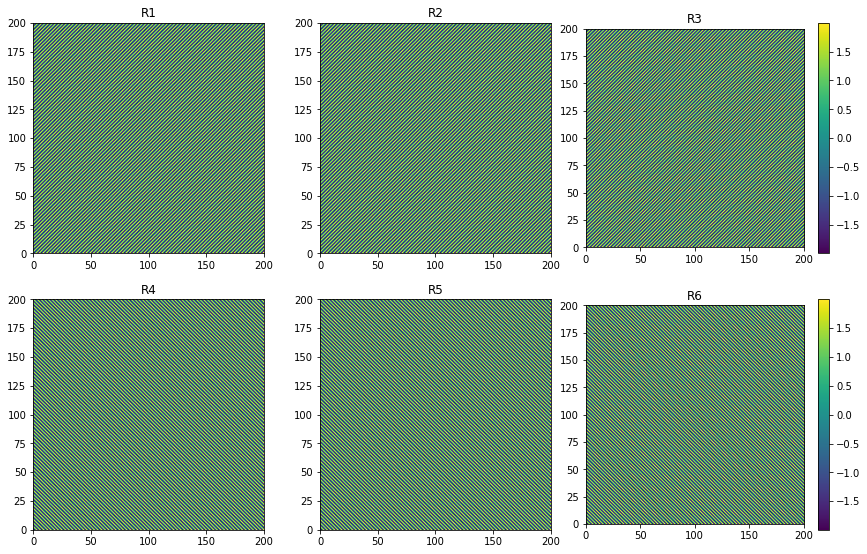

In [ ]:
plotAll([u.imag for u in uu_list], [t1, tau1, t1, tau3])

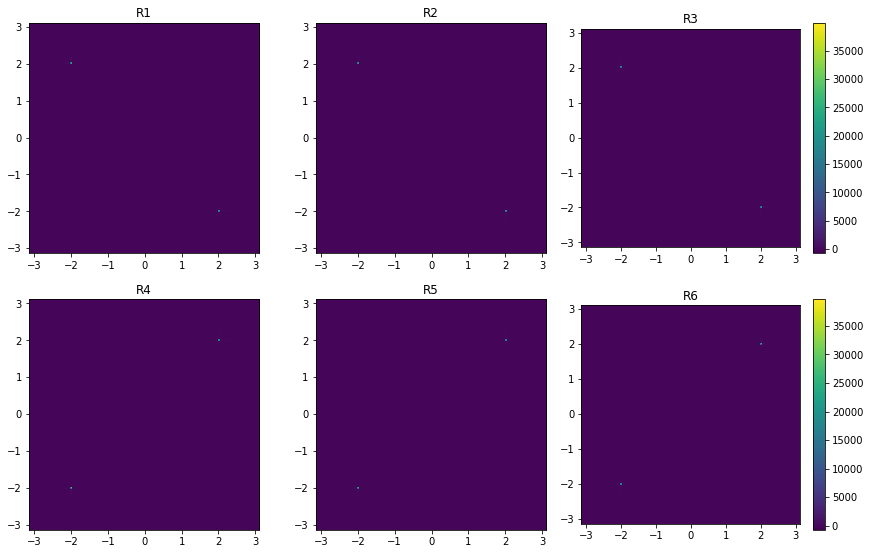

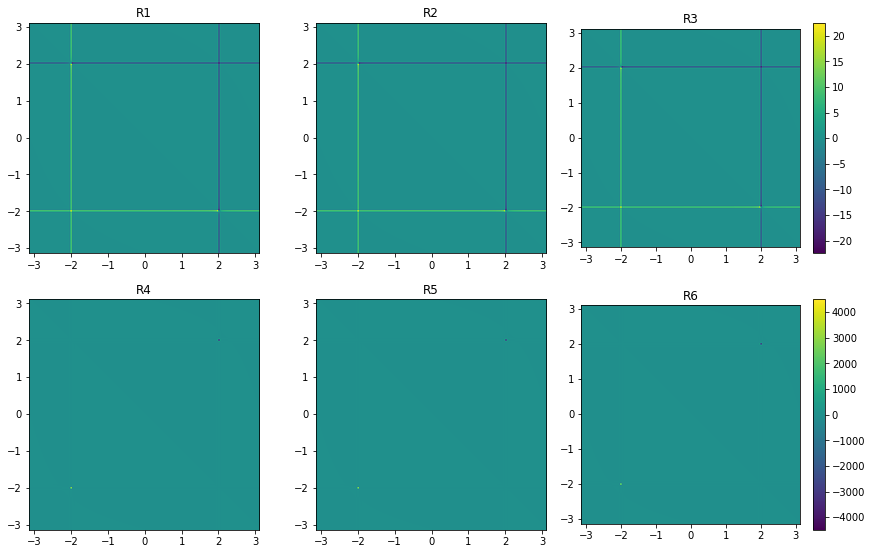

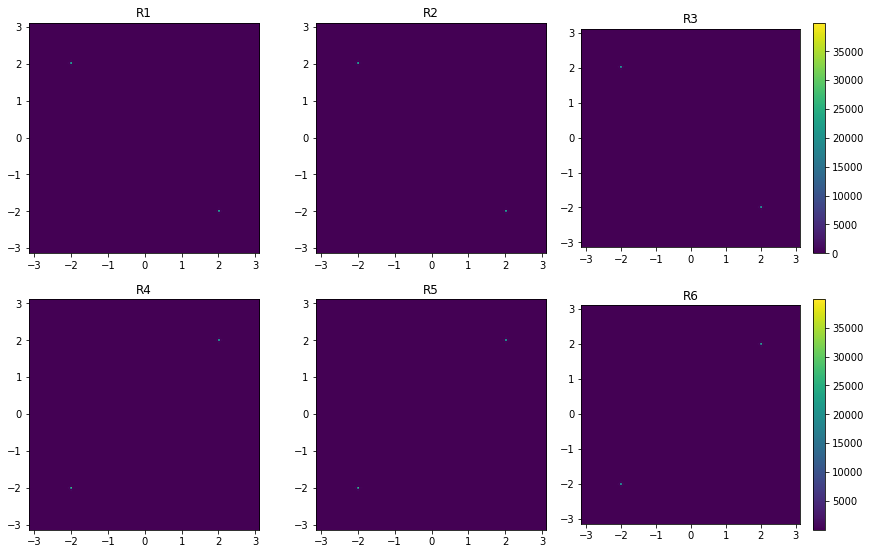

In [ ]:
specR1 = np.fft.fftshift(np.fft.fft2(uuR1.real))
specR2 = np.fft.fftshift(np.fft.fft2(uuR2.real))
specR3 = np.fft.fftshift(np.fft.fft2(uuR3.real))
specR4 = np.fft.fftshift(np.fft.fft2(uuR4.real))
specR5 = np.fft.fftshift(np.fft.fft2(uuR5.real))
specR6 = np.fft.fftshift(np.fft.fft2(uuR6.real))
spectra_list = [specR1,specR2,specR3,specR4,specR5,specR6]

N1, N2 = np.shape(specR1)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra = np.array(spectra_list)

plotAll(spectra.real, extent)
plotAll(spectra.imag, extent)
plotAll(np.abs(spectra), extent)

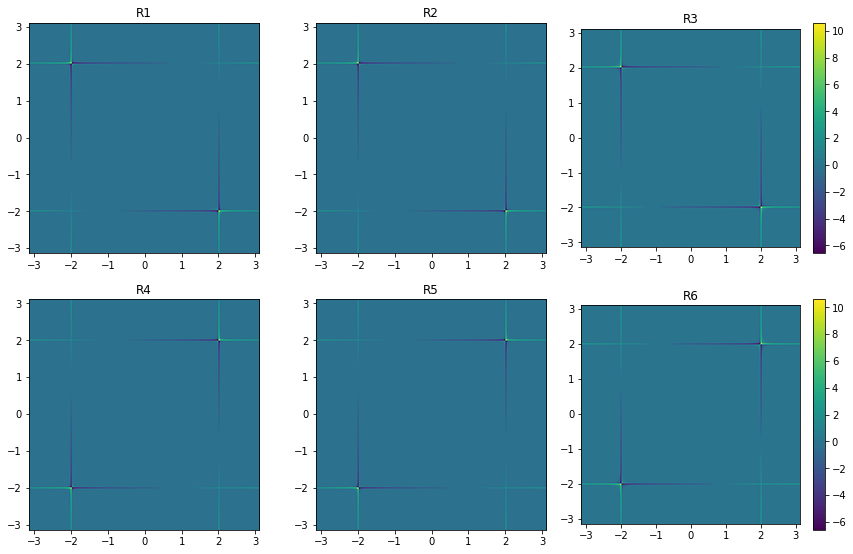

In [ ]:
# a log scale plot
plotAll(spectra.real, extent, scale='log')

## Including Dessipation in System:
With the addition of a dessipative term (such as 0.2*a) in the collapse operators, the system's response changes.


In [ ]:
sys1.c_ops = [0.2*sys1.a] #adding dessipation in the collapse operators list
sys1.c_ops

[Quantum object: dims = [[3], [3]], shape = (3, 3), type = oper, isherm = False
 Qobj data =
 [[0.         0.2        0.        ]
  [0.         0.         0.28284271]
  [0.         0.         0.        ]]]

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


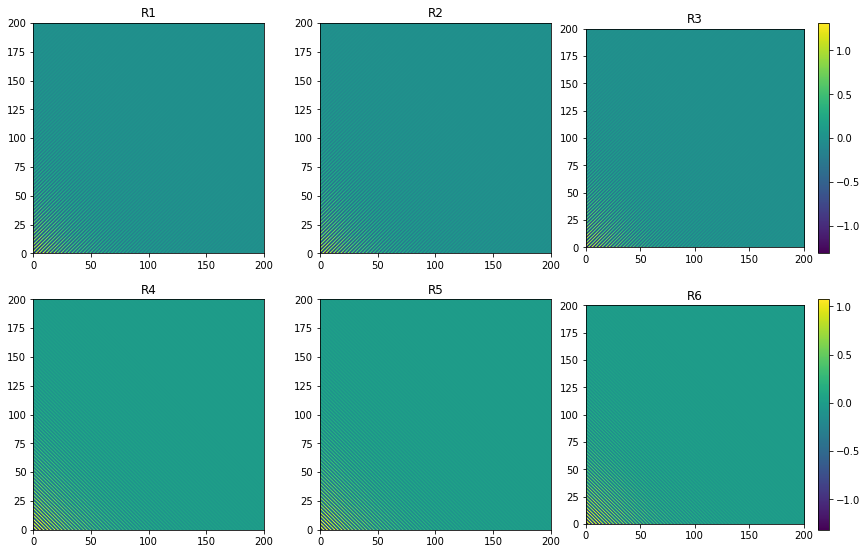

In [ ]:
statesR1_disi = sys1.response2D(R1, tau1, tau2, tau3, r)#, True) #computing the states' evolution for double-sided diagram
statesR2_disi = sys1.response2D(R2, tau1, tau2, tau3, r)#, True)
statesR3_disi = sys1.response2D(R3, tau1, tau2, tau3, r)#, True)
statesR4_disi = sys1.response2D(R4, tau1, tau2, tau3, r)#, True)
statesR5_disi = sys1.response2D(R5, tau1, tau2, tau3, r)#, True)
statesR6_disi = sys1.response2D(R6, tau1, tau2, tau3, r)#, True)
qsave(statesR1_disi, 'stateR1_r2_disi')
qsave(statesR2_disi, 'stateR2_r2_disi')
qsave(statesR3_disi, 'stateR3_r2_disi')
qsave(statesR4_disi, 'stateR4_r2_disi')
qsave(statesR5_disi, 'stateR5_r2_disi')
qsave(statesR6_disi, 'stateR6_r2_disi')

uuR1_disi = np.array([expect(sys1.u, statesR1_disi[x][:]) for x in range(len(statesR1_disi))])
uuR2_disi = np.array([expect(sys1.u, statesR2_disi[x][:]) for x in range(len(statesR2_disi))])
uuR3_disi = np.array([expect(sys1.u, statesR3_disi[x][:]) for x in range(len(statesR3_disi))])
uuR4_disi = np.array([expect(sys1.u, statesR4_disi[x][:]) for x in range(len(statesR4_disi))])
uuR5_disi = np.array([expect(sys1.u, statesR5_disi[x][:]) for x in range(len(statesR5_disi))])
uuR6_disi = np.array([expect(sys1.u, statesR6_disi[x][:]) for x in range(len(statesR6_disi))])
uu_list_disi = [uuR1_disi, uuR2_disi, uuR3_disi, uuR4_disi, uuR5_disi, uuR6_disi]
qsave(uuR1_disi, 'uuR1_r2_disi')
qsave(uuR2_disi, 'uuR2_r2_disi')
qsave(uuR3_disi, 'uuR3_r2_disi')
qsave(uuR4_disi, 'uuR4_r2_disi')
qsave(uuR5_disi, 'uuR5_r2_disi')
qsave(uuR6_disi, 'uuR6_r2_disi')
plotAll([u.imag for u in uu_list_disi], [t1, tau1, t1, tau3])


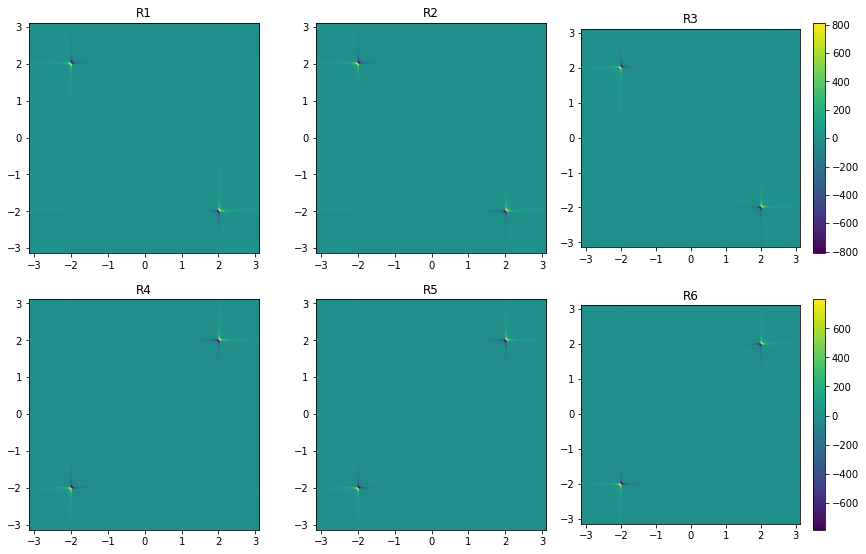

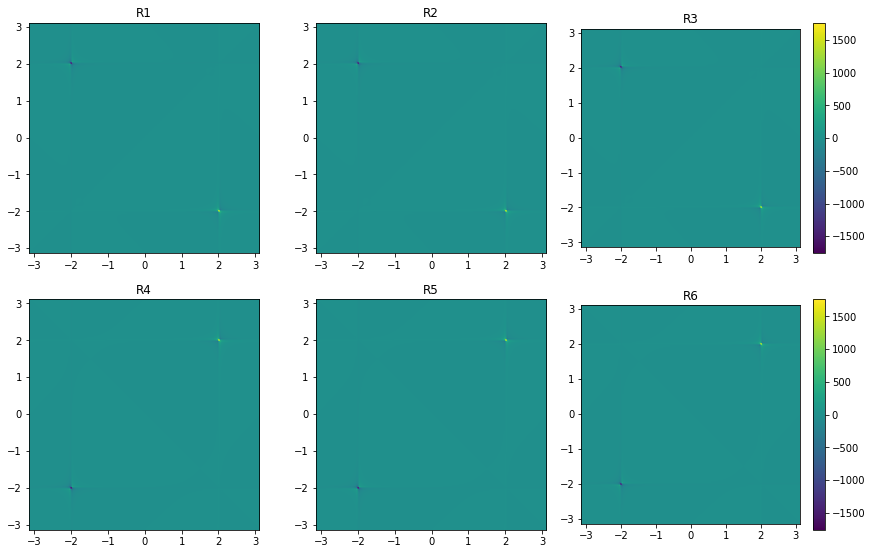

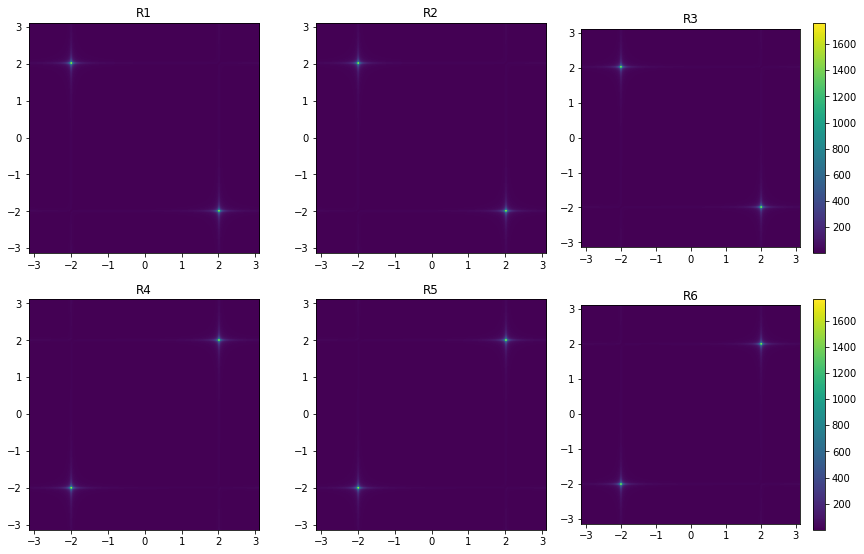

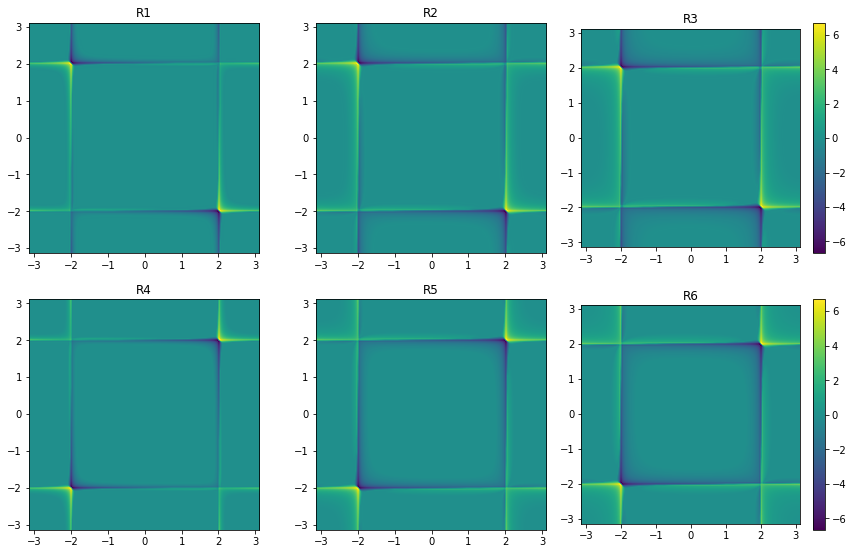

In [ ]:
specR1_disi = np.fft.fftshift(np.fft.fft2(uuR1_disi.imag))
specR2_disi = np.fft.fftshift(np.fft.fft2(uuR2_disi.imag))
specR3_disi = np.fft.fftshift(np.fft.fft2(uuR3_disi.imag))
specR4_disi = np.fft.fftshift(np.fft.fft2(uuR4_disi.imag))
specR5_disi = np.fft.fftshift(np.fft.fft2(uuR5_disi.imag))
specR6_disi = np.fft.fftshift(np.fft.fft2(uuR6_disi.imag))
spectra_list_disi = [specR1_disi,specR2_disi,specR3_disi,specR4_disi,specR5_disi,specR6_disi]

N1, N2 = np.shape(specR1_disi)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_disi)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_disi)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra_disi = np.array(spectra_list_disi)
plotAll(spectra_disi.real, extent)
plotAll(spectra_disi.imag, extent)
plotAll(np.abs(spectra_disi), extent)

# a log scale plot
plotAll(spectra_disi.real, extent, scale='log')

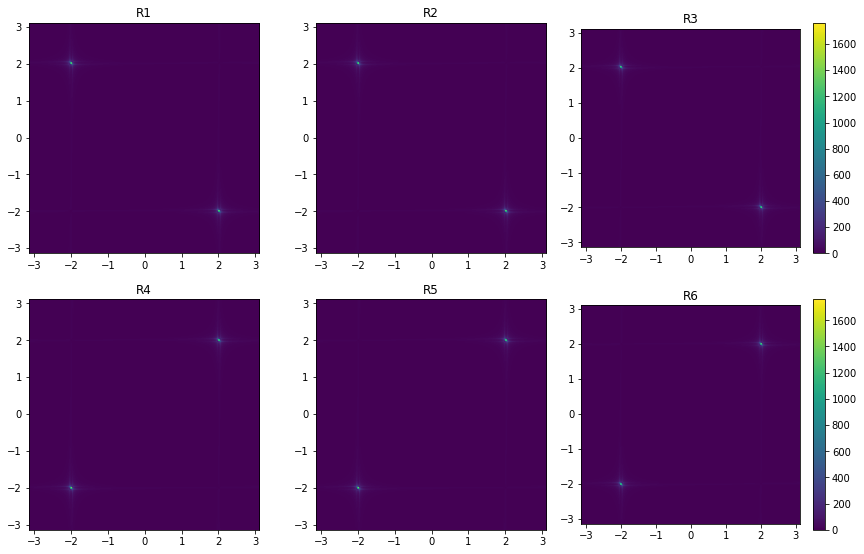

In [ ]:
plotAll(np.abs(spectra_disi), extent)

# Effect of Dephasing
Introducing dephasing dynamics such as coupling to a single phonon

In [ ]:
sys1.c_ops = [sys1.a.dag()*sys1.a*0.2]
sys1.c_ops

[Quantum object: dims = [[3], [3]], shape = (3, 3), type = oper, isherm = True
 Qobj data =
 [[0.  0.  0. ]
  [0.  0.2 0. ]
  [0.  0.  0.4]]]

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


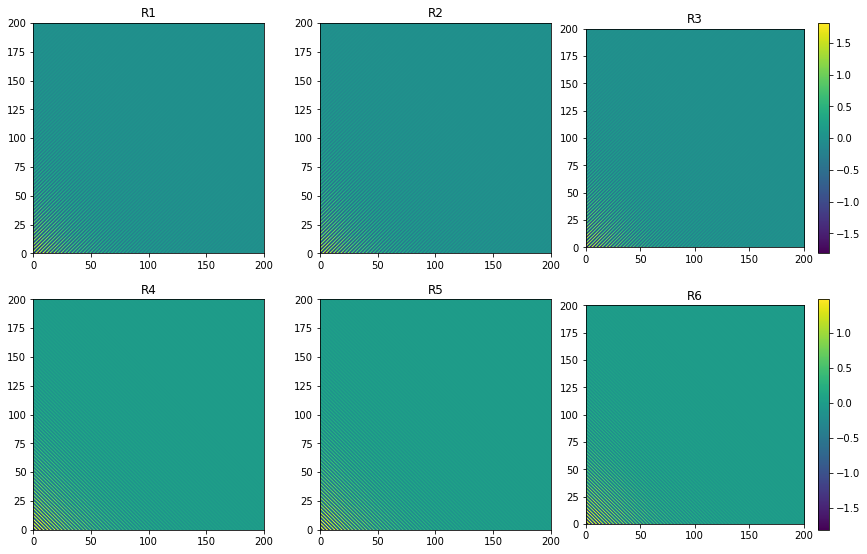

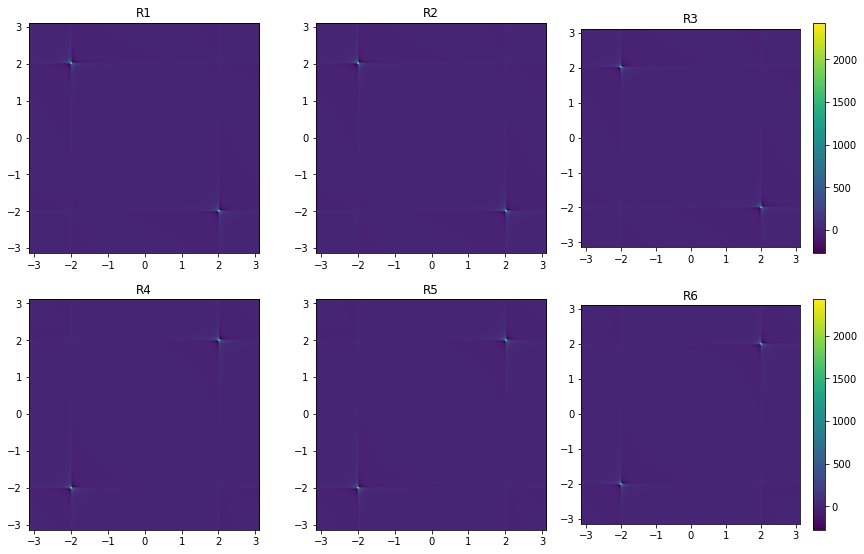

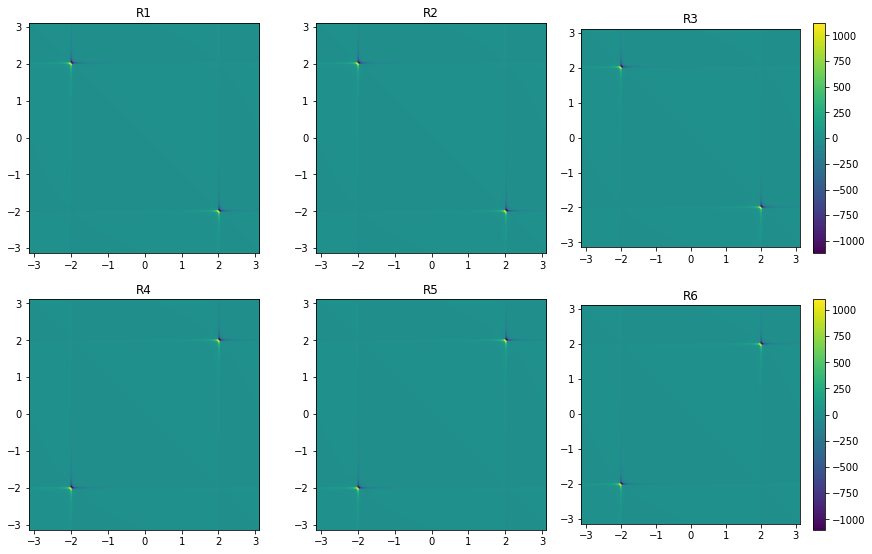

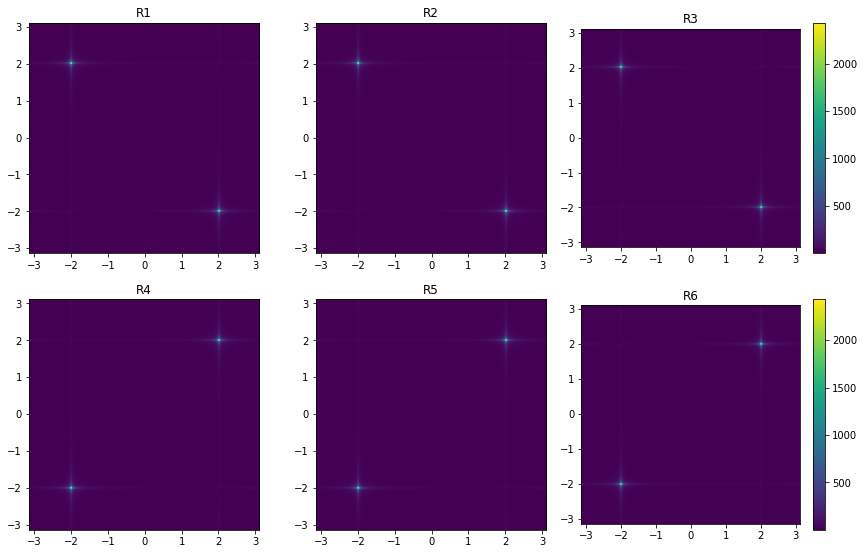

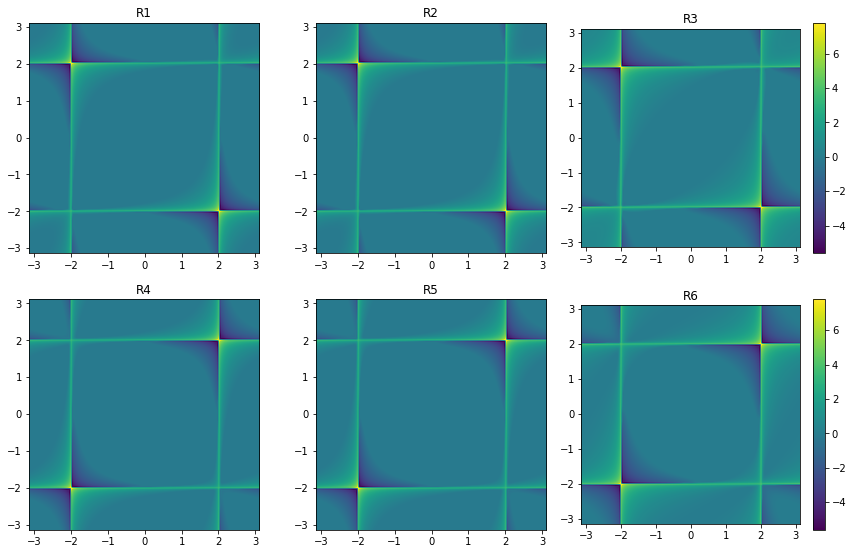

In [ ]:
statesR1_deph = sys1.response2D(R1, tau1, tau2, tau3, r, True) #computing the states' evolution for double-sided diagram
statesR2_deph = sys1.response2D(R2, tau1, tau2, tau3, r, True)
statesR3_deph = sys1.response2D(R3, tau1, tau2, tau3, r, True)
statesR4_deph = sys1.response2D(R4, tau1, tau2, tau3, r, True)
statesR5_deph = sys1.response2D(R5, tau1, tau2, tau3, r, True)
statesR6_deph = sys1.response2D(R6, tau1, tau2, tau3, r, True)
qsave(statesR1_deph, 'stateR1_r2_deph')
qsave(statesR2_deph, 'stateR2_r2_deph')
qsave(statesR3_deph, 'stateR3_r2_deph')
qsave(statesR4_deph, 'stateR4_r2_deph')
qsave(statesR5_deph, 'stateR5_r2_deph')
qsave(statesR6_deph, 'stateR6_r2_deph')

uuR1_deph = np.array([expect(sys1.u, statesR1_deph[x][:]) for x in range(len(statesR1_deph))])
uuR2_deph = np.array([expect(sys1.u, statesR2_deph[x][:]) for x in range(len(statesR2_deph))])
uuR3_deph = np.array([expect(sys1.u, statesR3_deph[x][:]) for x in range(len(statesR3_deph))])
uuR4_deph = np.array([expect(sys1.u, statesR4_deph[x][:]) for x in range(len(statesR4_deph))])
uuR5_deph = np.array([expect(sys1.u, statesR5_deph[x][:]) for x in range(len(statesR5_deph))])
uuR6_deph = np.array([expect(sys1.u, statesR6_deph[x][:]) for x in range(len(statesR6_deph))])
uu_list_deph = [uuR1_deph, uuR2_deph, uuR3_deph, uuR4_deph, uuR5_deph, uuR6_deph]
qsave(uuR1_deph, 'uuR1_r2_deph')
qsave(uuR2_deph, 'uuR2_r2_deph')
qsave(uuR3_deph, 'uuR3_r2_deph')
qsave(uuR4_deph, 'uuR4_r2_deph')
qsave(uuR5_deph, 'uuR5_r2_deph')
qsave(uuR6_deph, 'uuR6_r2_deph')
plotAll([u.imag for u in uu_list_deph], [t1, tau1, t1, tau3])


specR1_deph = np.fft.fftshift(np.fft.fft2(uuR1_deph.real))
specR2_deph = np.fft.fftshift(np.fft.fft2(uuR2_deph.real))
specR3_deph = np.fft.fftshift(np.fft.fft2(uuR3_deph.real))
specR4_deph = np.fft.fftshift(np.fft.fft2(uuR4_deph.real))
specR5_deph = np.fft.fftshift(np.fft.fft2(uuR5_deph.real))
specR6_deph = np.fft.fftshift(np.fft.fft2(uuR6_deph.real))
spectra_list_deph = [specR1_deph,specR2_deph,specR3_deph,specR4_deph,specR5_deph,specR6_deph]

N1, N2 = np.shape(specR1_deph)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_deph)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_deph)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra_deph = np.array(spectra_list_deph)
plotAll(spectra_deph.real, extent)
plotAll(spectra_deph.imag, extent)
plotAll(np.abs(spectra_deph), extent)

# a log scale plot
plotAll(spectra_deph.real, extent, scale='log')


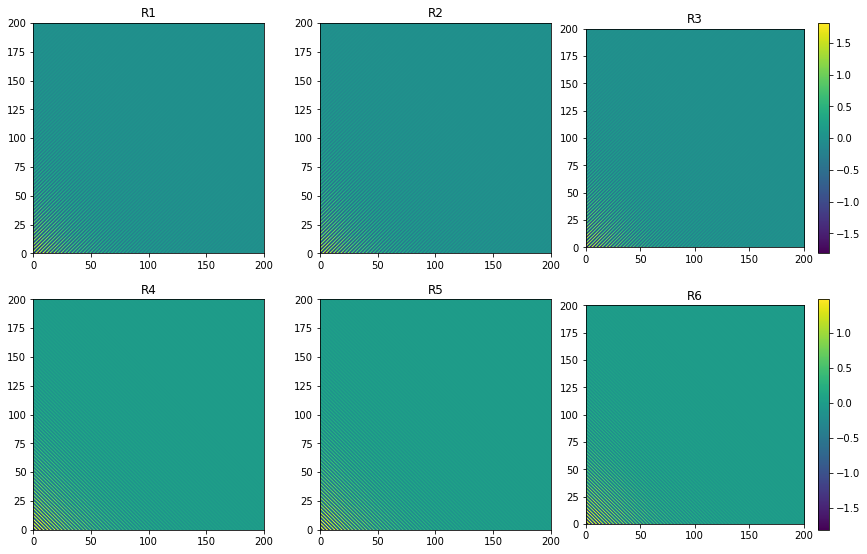

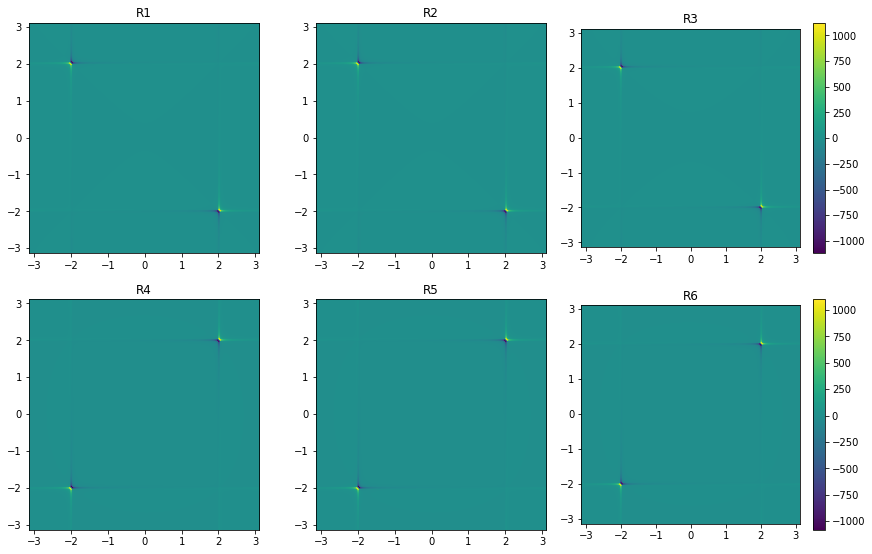

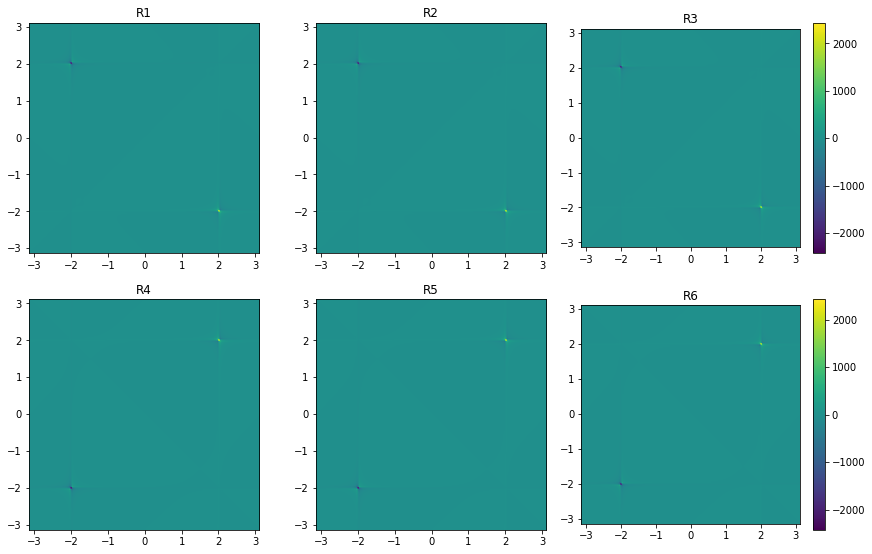

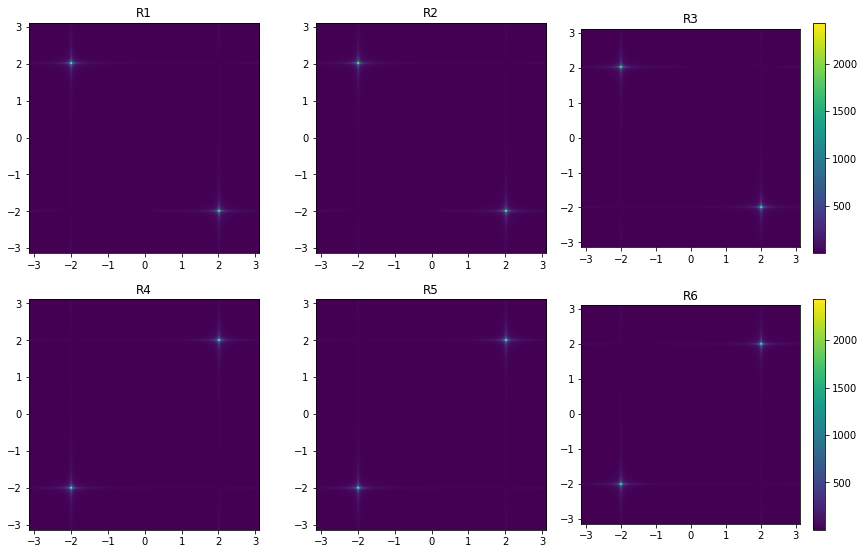

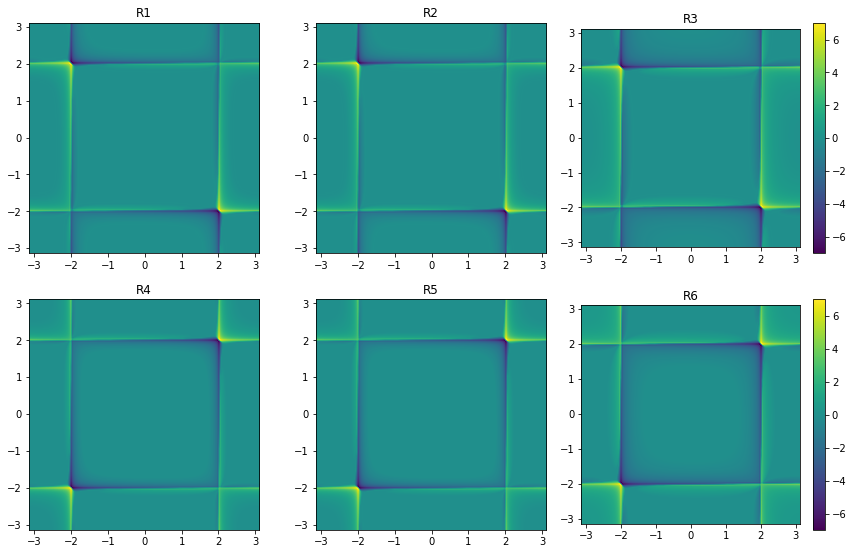

In [ ]:
plotAll([u.imag for u in uu_list_deph], [t1, tau1, t1, tau3])
specR1_deph = np.fft.fftshift(np.fft.fft2(uuR1_deph.imag))
specR2_deph = np.fft.fftshift(np.fft.fft2(uuR2_deph.imag))
specR3_deph = np.fft.fftshift(np.fft.fft2(uuR3_deph.imag))
specR4_deph = np.fft.fftshift(np.fft.fft2(uuR4_deph.imag))
specR5_deph = np.fft.fftshift(np.fft.fft2(uuR5_deph.imag))
specR6_deph = np.fft.fftshift(np.fft.fft2(uuR6_deph.imag))
spectra_list_deph = [specR1_deph,specR2_deph,specR3_deph,specR4_deph,specR5_deph,specR6_deph]

N1, N2 = np.shape(specR1_deph)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_deph)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_deph)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra_deph = np.array(spectra_list_deph)
plotAll(spectra_deph.real, extent)
plotAll(spectra_deph.imag, extent)
plotAll(np.abs(spectra_deph), extent)

# a log scale plot
plotAll(spectra_deph.real, extent, scale='log')

# The Spano Complex

without dissipation or dephasing

In [ ]:
hbar = 0.65821195107 # eV fs
h = 4.13566766 # eV fs
#energy = hbar*omega = h*freq
# freq = energy/h
# omega = energy/hbar
# omega = 2*pi*f 
n=2 # levels in excitonic sub-systems including the ground state
m=2 # levels in phononic sub-systems including the ground state
a1 = tensor(destroy(n), qeye(n), qeye(m), qeye(m))
a2 = tensor(qeye(n), destroy(n), qeye(m), qeye(m))
b1 = tensor(qeye(n), qeye(n), destroy(m), qeye(m))
b2 = tensor(qeye(n), qeye(n), qeye(m), destroy(m))
hbar = 0.658211951 # eV fs
h = 4.13566766 # eV fs
E = 2 #eV
f = E/h
w = E/hbar #2*np.pi*f
j = 0.015/hbar # coupling in 2*pi/fs
W1 = W2 = 0.2/hbar # phonon Omega in 2*pi/fs
He = hbar*(w*a1.dag()*a1 + w*a2.dag()*a2 + j*(a1.dag()*a2 + a1*a2.dag()))
Hp = hbar*(W1*b1.dag()*b1 + W2*b2.dag()*b2)
S = 1 # Huang-Rhys factor
Hep = hbar*(S*W1*(b1+b1.dag())*a1.dag()*a1 + S*W2*(b2+b2.dag())*a2.dag()*a2)
mu = 1
u1 = mu*(a1.dag()+a1)
u2 = mu*(a2.dag()+a2)
u = u1+u2
H = He+Hp+Hep
eigen_energies, eigen_states = H.eigenstates()
H_diag = H.transform(eigen_states)
u_diag = u.transform(eigen_states)
psi = eigen_states[0]
a_diag = (a1+a2).transform(eigen_states)
c_ops = []
spano = System(n=2, H=H_diag, rho=psi*psi.dag(), a=a_diag, u=u_diag, c_ops=c_ops, e_ops=[], tlist=None)

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


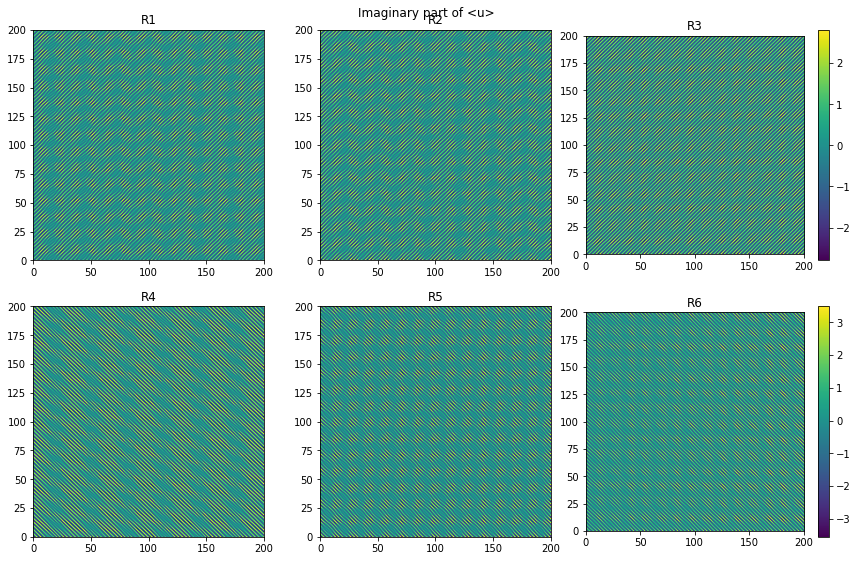

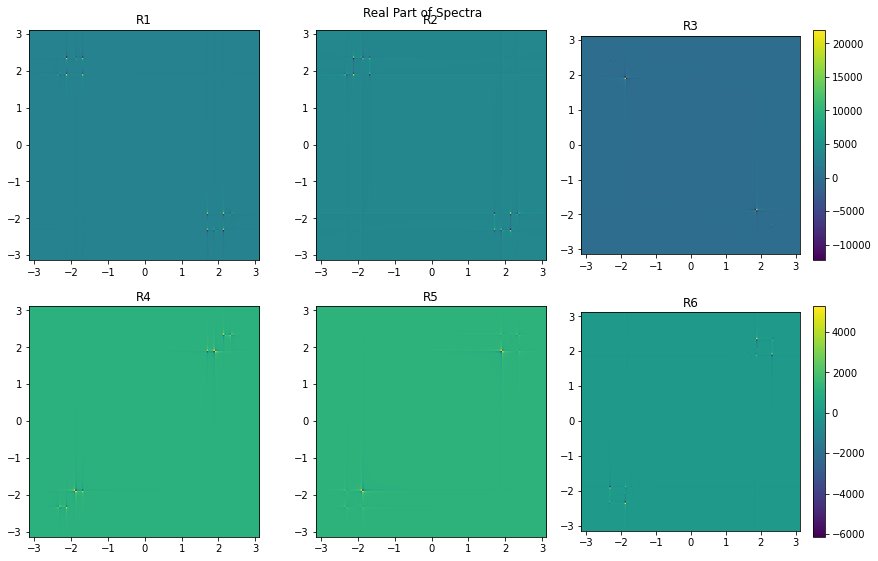

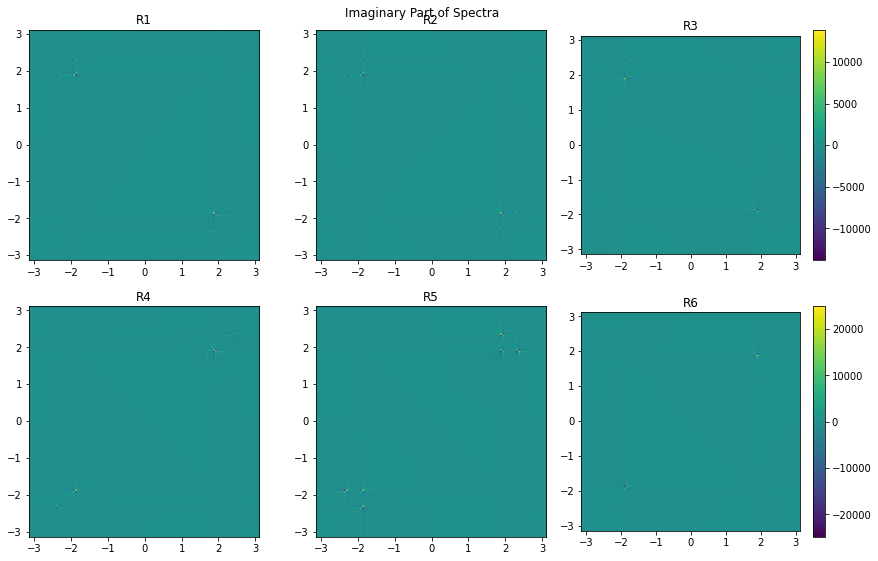

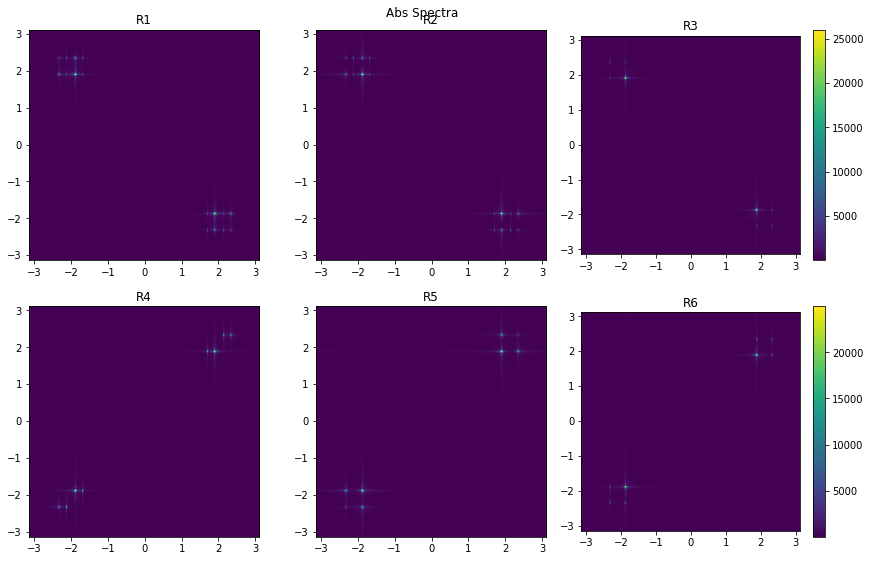

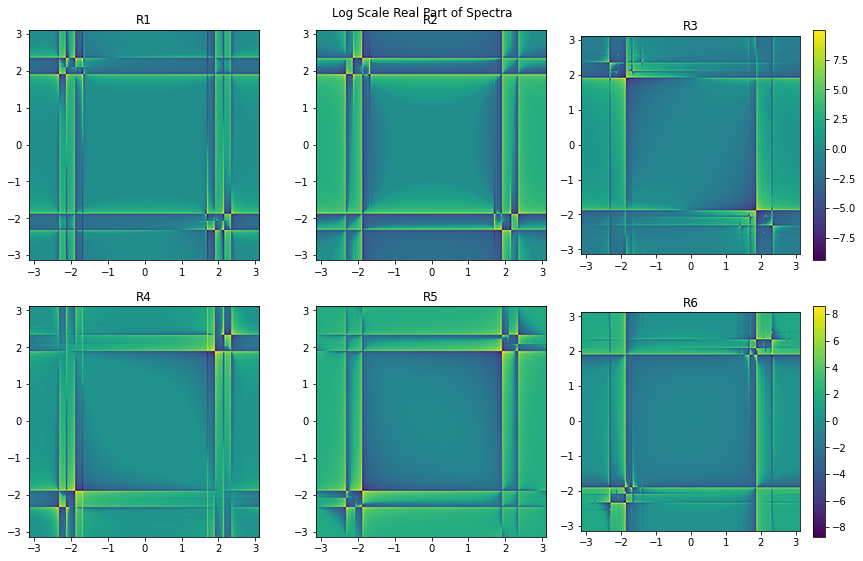

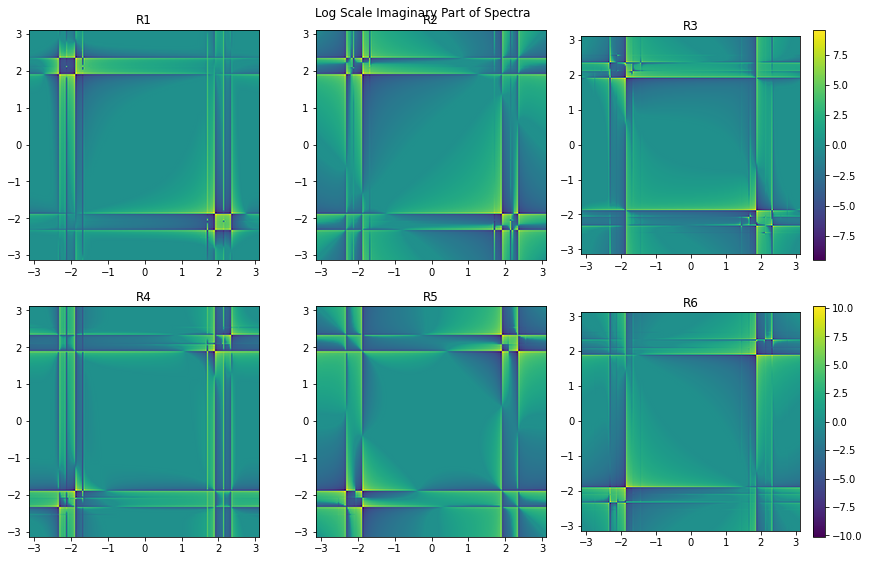

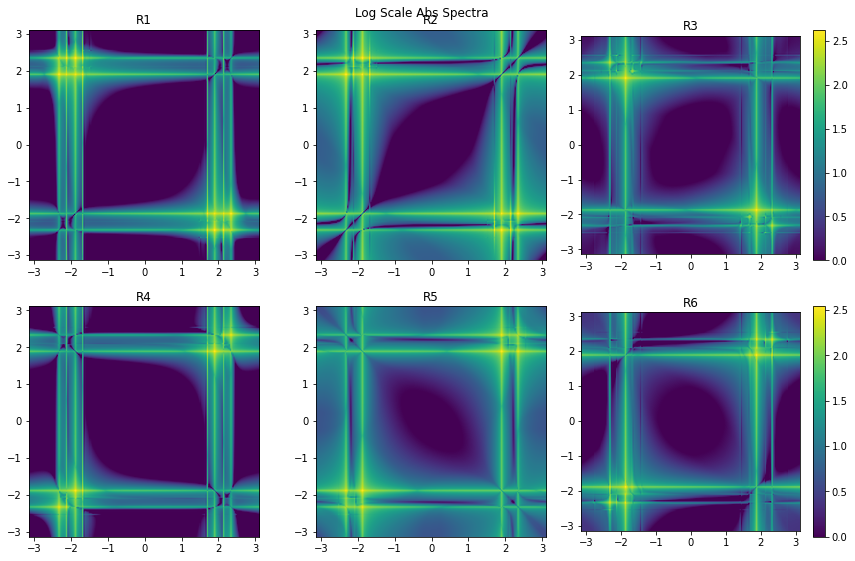

In [ ]:
statesR1_spano = spano.response2D(R1, tau1, tau2, tau3, r, True) #computing the states' evolution for double-sided diagram
statesR2_spano = spano.response2D(R2, tau1, tau2, tau3, r, True)
statesR3_spano = spano.response2D(R3, tau1, tau2, tau3, r, True)
statesR4_spano = spano.response2D(R4, tau1, tau2, tau3, r, True)
statesR5_spano = spano.response2D(R5, tau1, tau2, tau3, r, True)
statesR6_spano = spano.response2D(R6, tau1, tau2, tau3, r, True)
qsave(statesR1_spano, 'stateR1_r2_spano')
qsave(statesR2_spano, 'stateR2_r2_spano')
qsave(statesR3_spano, 'stateR3_r2_spano')
qsave(statesR4_spano, 'stateR4_r2_spano')
qsave(statesR5_spano, 'stateR5_r2_spano')
qsave(statesR6_spano, 'stateR6_r2_spano')

uuR1_spano = np.array([expect(spano.u, statesR1_spano[x][:]) for x in range(len(statesR1_spano))])
uuR2_spano = np.array([expect(spano.u, statesR2_spano[x][:]) for x in range(len(statesR2_spano))])
uuR3_spano = np.array([expect(spano.u, statesR3_spano[x][:]) for x in range(len(statesR3_spano))])
uuR4_spano = np.array([expect(spano.u, statesR4_spano[x][:]) for x in range(len(statesR4_spano))])
uuR5_spano = np.array([expect(spano.u, statesR5_spano[x][:]) for x in range(len(statesR5_spano))])
uuR6_spano = np.array([expect(spano.u, statesR6_spano[x][:]) for x in range(len(statesR6_spano))])
uu_list_spano = [uuR1_spano, uuR2_spano, uuR3_spano, uuR4_spano, uuR5_spano, uuR6_spano]
qsave(uuR1_spano, 'uuR1_r2_spano')
qsave(uuR2_spano, 'uuR2_r2_spano')
qsave(uuR3_spano, 'uuR3_r2_spano')
qsave(uuR4_spano, 'uuR4_r2_spano')
qsave(uuR5_spano, 'uuR5_r2_spano')
qsave(uuR6_spano, 'uuR6_r2_spano')
plotAll([u.imag for u in uu_list_spano], [t1, tau1, t1, tau3], title='Imaginary part of <u>')

specR1_spano = np.fft.fftshift(np.fft.fft2(uuR1_spano.imag))
specR2_spano = np.fft.fftshift(np.fft.fft2(uuR2_spano.imag))
specR3_spano = np.fft.fftshift(np.fft.fft2(uuR3_spano.imag))
specR4_spano = np.fft.fftshift(np.fft.fft2(uuR4_spano.imag))
specR5_spano = np.fft.fftshift(np.fft.fft2(uuR5_spano.imag))
specR6_spano = np.fft.fftshift(np.fft.fft2(uuR6_spano.imag))
spectra_list_spano = [specR1_spano,specR2_spano,specR3_spano,specR4_spano,specR5_spano,specR6_spano]

N1, N2 = np.shape(specR1_spano)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra_spano = np.array(spectra_list_spano)
plotAll(spectra_spano.real, extent, title='Real Part of Spectra')
plotAll(spectra_spano.imag, extent, title='Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, title='Abs Spectra')

# a log scale plot

plotAll(spectra_spano.real, extent, scale='log',title='Log Scale Real Part of Spectra')
plotAll(spectra_spano.imag, extent, scale='log',title='Log Scale Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, scale='log',title='Log Scale Abs Spectra')

### Dissipation: Spano Complex

with dissipation $\gamma a$ with $\gamma = \sqrt{0.2}$

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


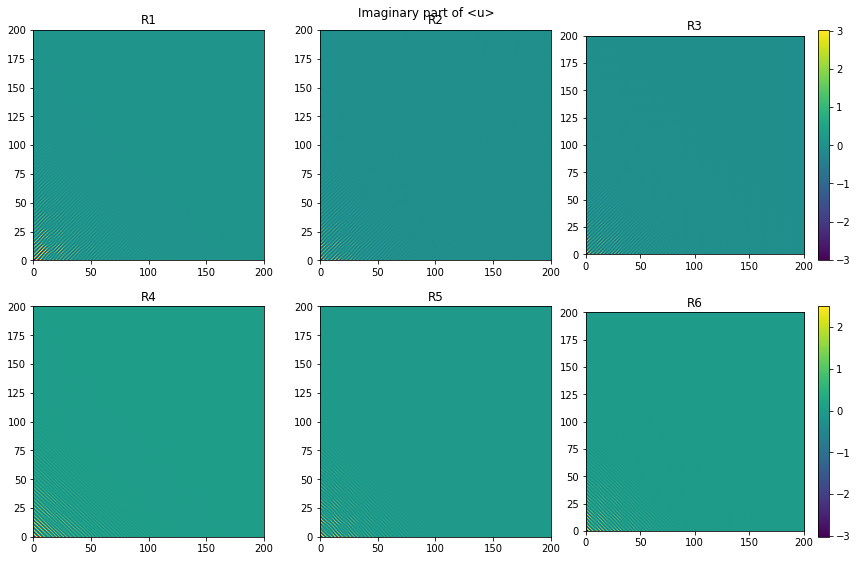

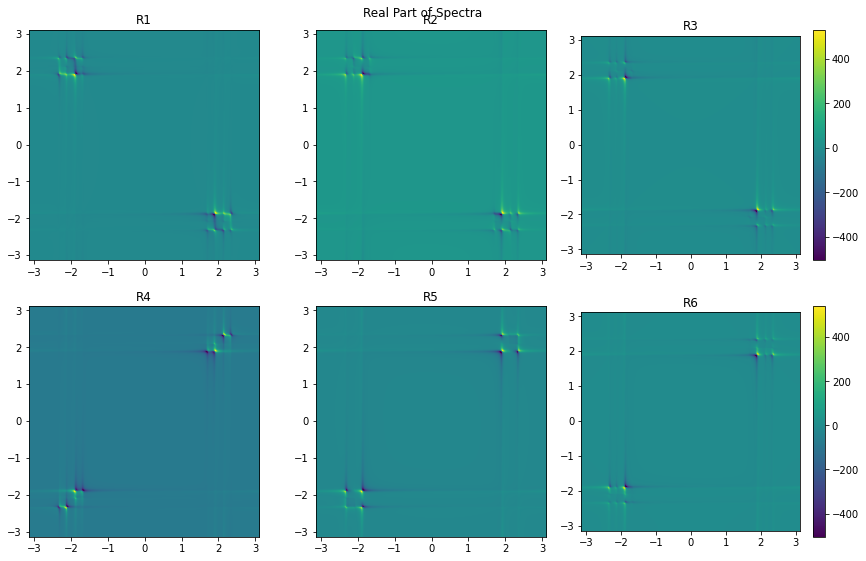

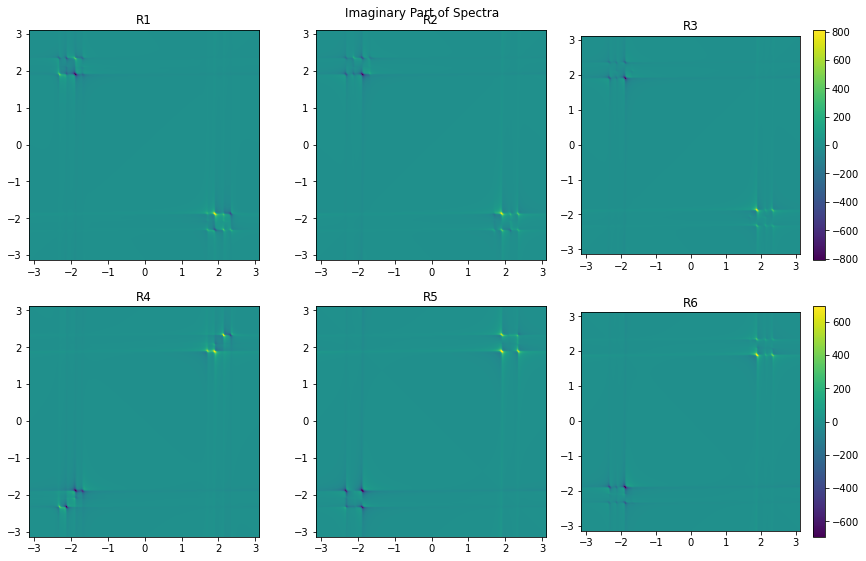

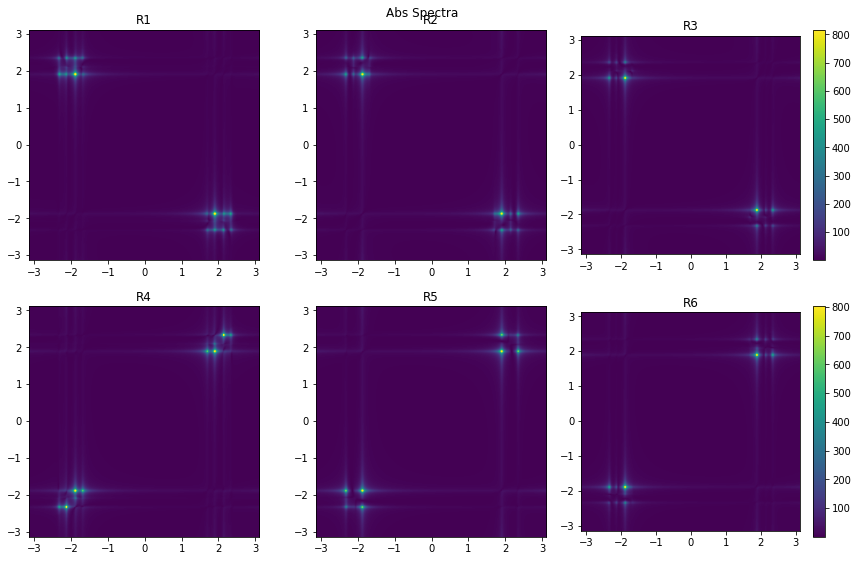

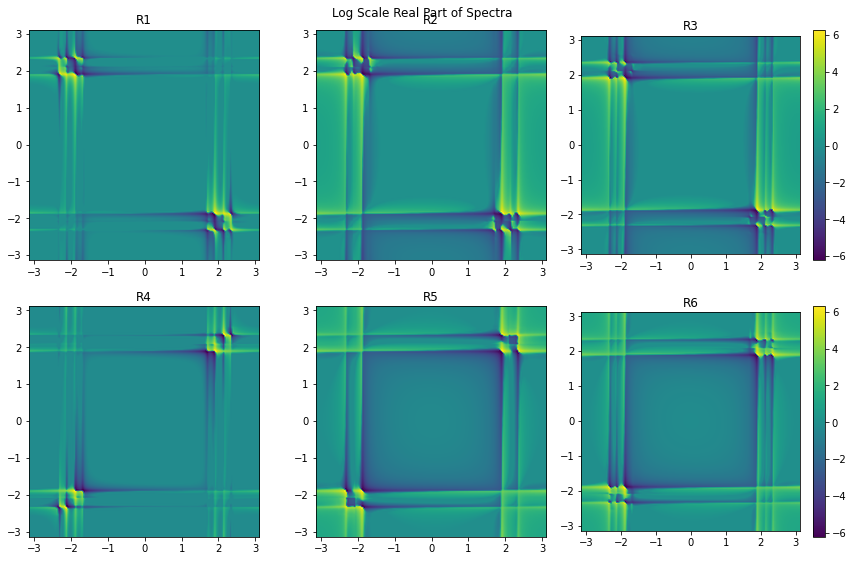

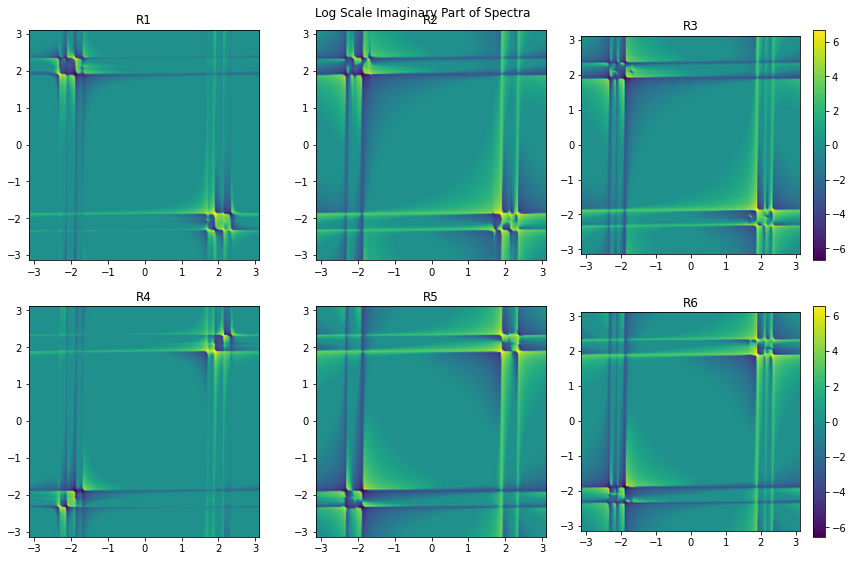

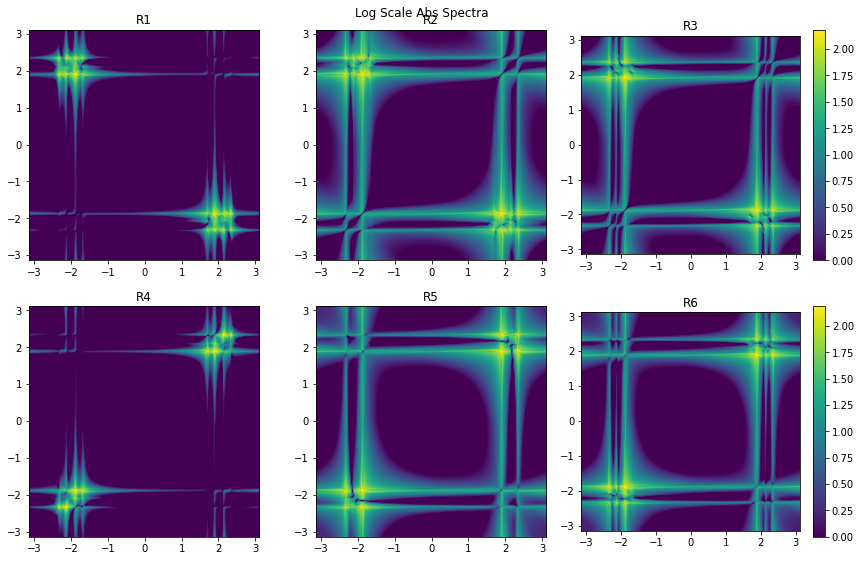

In [ ]:
spano.c_ops = [0.2*a_diag]
statesR1_spano = spano.response2D(R1, tau1, tau2, tau3, r, True) #computing the states' evolution for double-sided diagram
statesR2_spano = spano.response2D(R2, tau1, tau2, tau3, r, True)
statesR3_spano = spano.response2D(R3, tau1, tau2, tau3, r, True)
statesR4_spano = spano.response2D(R4, tau1, tau2, tau3, r, True)
statesR5_spano = spano.response2D(R5, tau1, tau2, tau3, r, True)
statesR6_spano = spano.response2D(R6, tau1, tau2, tau3, r, True)
qsave(statesR1_spano, 'stateR1_r2_spano')
qsave(statesR2_spano, 'stateR2_r2_spano')
qsave(statesR3_spano, 'stateR3_r2_spano')
qsave(statesR4_spano, 'stateR4_r2_spano')
qsave(statesR5_spano, 'stateR5_r2_spano')
qsave(statesR6_spano, 'stateR6_r2_spano')

uuR1_spano = np.array([expect(spano.u, statesR1_spano[x][:]) for x in range(len(statesR1_spano))])
uuR2_spano = np.array([expect(spano.u, statesR2_spano[x][:]) for x in range(len(statesR2_spano))])
uuR3_spano = np.array([expect(spano.u, statesR3_spano[x][:]) for x in range(len(statesR3_spano))])
uuR4_spano = np.array([expect(spano.u, statesR4_spano[x][:]) for x in range(len(statesR4_spano))])
uuR5_spano = np.array([expect(spano.u, statesR5_spano[x][:]) for x in range(len(statesR5_spano))])
uuR6_spano = np.array([expect(spano.u, statesR6_spano[x][:]) for x in range(len(statesR6_spano))])
uu_list_spano = [uuR1_spano, uuR2_spano, uuR3_spano, uuR4_spano, uuR5_spano, uuR6_spano]
qsave(uuR1_spano, 'uuR1_r2_spano')
qsave(uuR2_spano, 'uuR2_r2_spano')
qsave(uuR3_spano, 'uuR3_r2_spano')
qsave(uuR4_spano, 'uuR4_r2_spano')
qsave(uuR5_spano, 'uuR5_r2_spano')
qsave(uuR6_spano, 'uuR6_r2_spano')
plotAll([u.imag for u in uu_list_spano], [t1, tau1, t1, tau3], title='Imaginary part of <u>')

specR1_spano = np.fft.fftshift(np.fft.fft2(uuR1_spano.imag))
specR2_spano = np.fft.fftshift(np.fft.fft2(uuR2_spano.imag))
specR3_spano = np.fft.fftshift(np.fft.fft2(uuR3_spano.imag))
specR4_spano = np.fft.fftshift(np.fft.fft2(uuR4_spano.imag))
specR5_spano = np.fft.fftshift(np.fft.fft2(uuR5_spano.imag))
specR6_spano = np.fft.fftshift(np.fft.fft2(uuR6_spano.imag))
spectra_list_spano = [specR1_spano,specR2_spano,specR3_spano,specR4_spano,specR5_spano,specR6_spano]

N1, N2 = np.shape(specR1_spano)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra_spano = np.array(spectra_list_spano)
plotAll(spectra_spano.real, extent, title='Real Part of Spectra')
plotAll(spectra_spano.imag, extent, title='Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, title='Abs Spectra')

# a log scale plot

plotAll(spectra_spano.real, extent, scale='log',title='Log Scale Real Part of Spectra')
plotAll(spectra_spano.imag, extent, scale='log',title='Log Scale Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, scale='log',title='Log Scale Abs Spectra')

### Dephasing Spano Complex

with dephasing $\gamma a^\dagger a$ with $\gamma = \sqrt{0.2}$

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


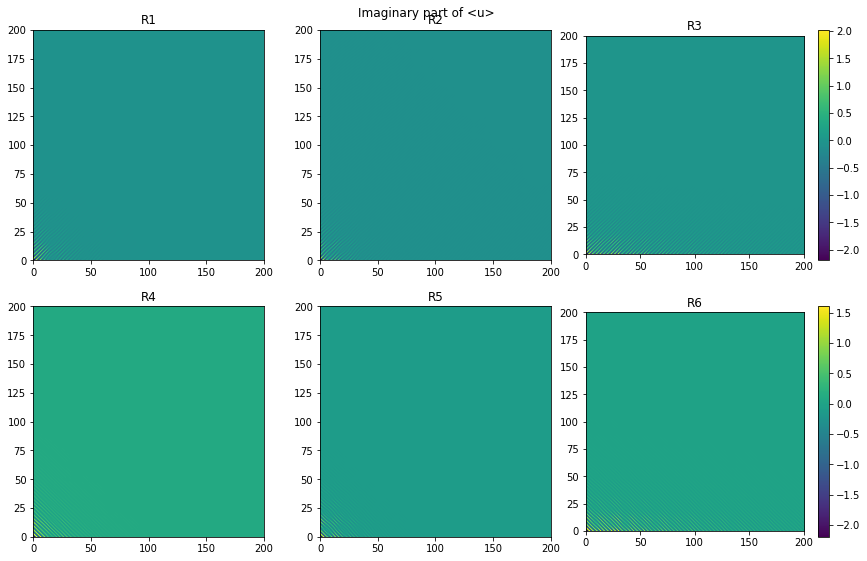

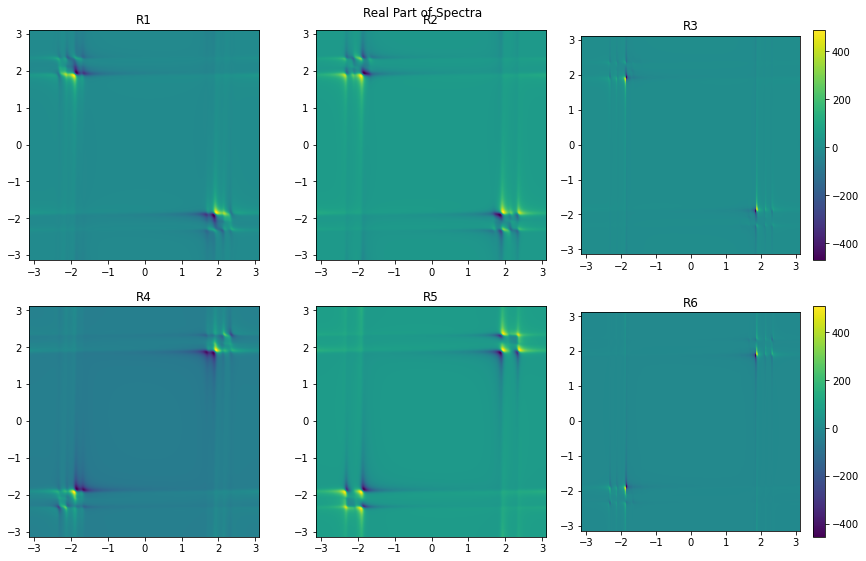

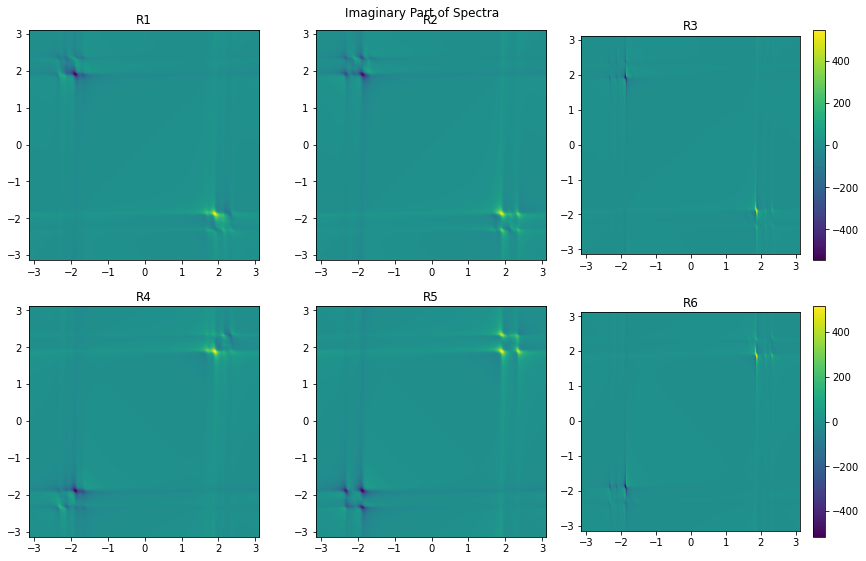

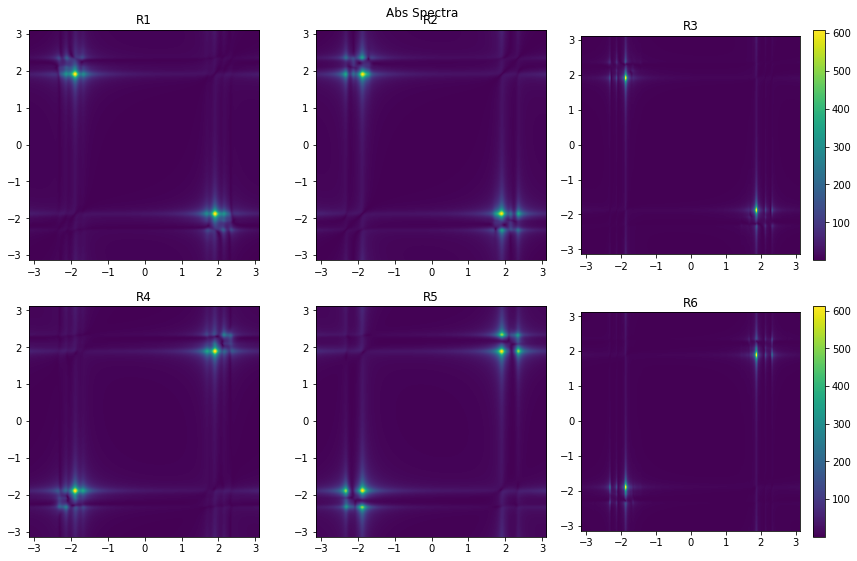

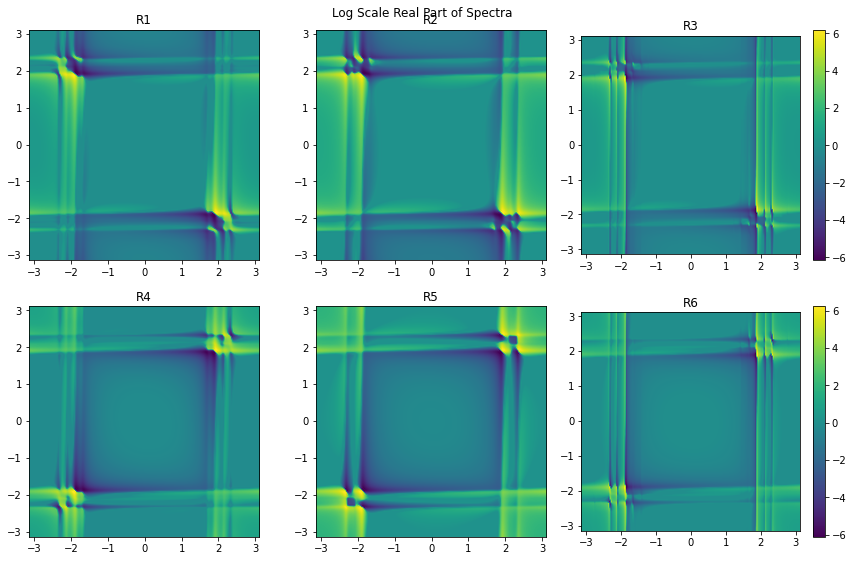

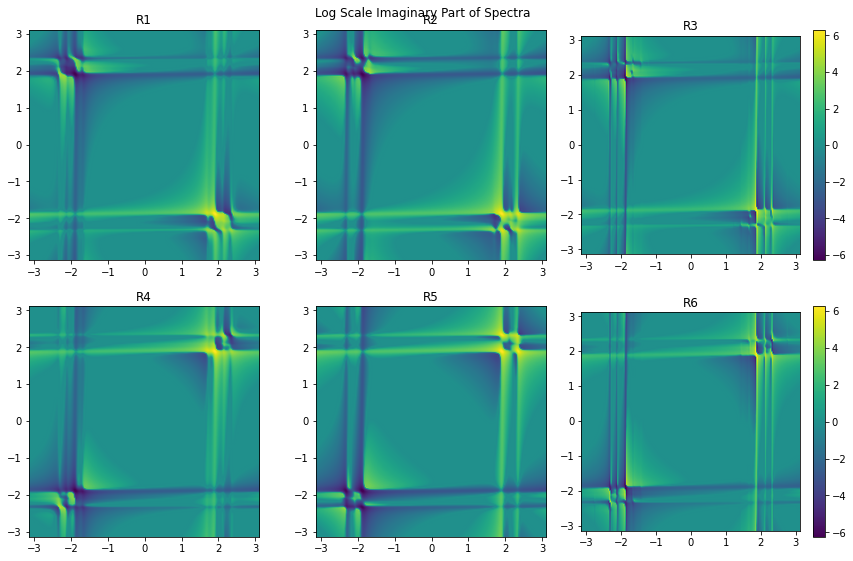

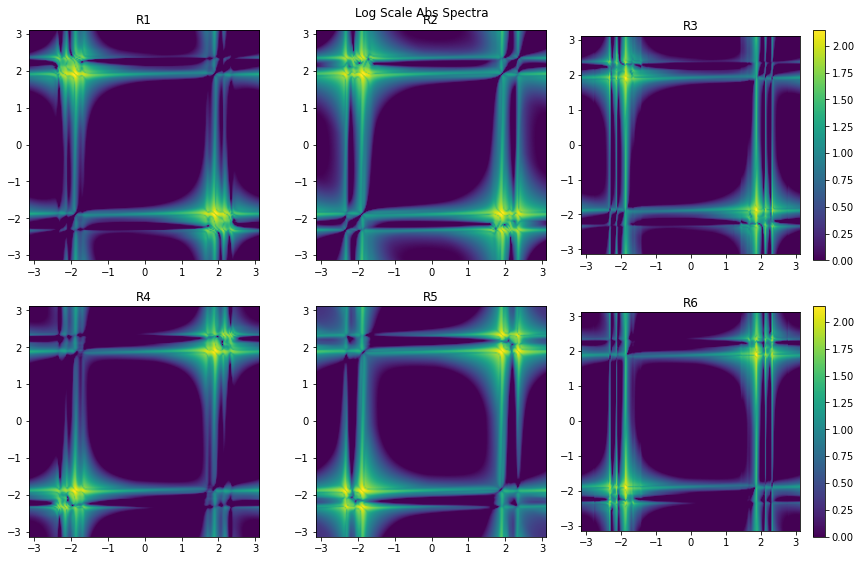

In [ ]:
spano.c_ops = [0.2*a_diag.dag()*a_diag]
statesR1_spano = spano.response2D(R1, tau1, tau2, tau3, r, True) #computing the states' evolution for double-sided diagram
statesR2_spano = spano.response2D(R2, tau1, tau2, tau3, r, True)
statesR3_spano = spano.response2D(R3, tau1, tau2, tau3, r, True)
statesR4_spano = spano.response2D(R4, tau1, tau2, tau3, r, True)
statesR5_spano = spano.response2D(R5, tau1, tau2, tau3, r, True)
statesR6_spano = spano.response2D(R6, tau1, tau2, tau3, r, True)
qsave(statesR1_spano, 'stateR1_r2_spano')
qsave(statesR2_spano, 'stateR2_r2_spano')
qsave(statesR3_spano, 'stateR3_r2_spano')
qsave(statesR4_spano, 'stateR4_r2_spano')
qsave(statesR5_spano, 'stateR5_r2_spano')
qsave(statesR6_spano, 'stateR6_r2_spano')

uuR1_spano = np.array([expect(spano.u, statesR1_spano[x][:]) for x in range(len(statesR1_spano))])
uuR2_spano = np.array([expect(spano.u, statesR2_spano[x][:]) for x in range(len(statesR2_spano))])
uuR3_spano = np.array([expect(spano.u, statesR3_spano[x][:]) for x in range(len(statesR3_spano))])
uuR4_spano = np.array([expect(spano.u, statesR4_spano[x][:]) for x in range(len(statesR4_spano))])
uuR5_spano = np.array([expect(spano.u, statesR5_spano[x][:]) for x in range(len(statesR5_spano))])
uuR6_spano = np.array([expect(spano.u, statesR6_spano[x][:]) for x in range(len(statesR6_spano))])
uu_list_spano = [uuR1_spano, uuR2_spano, uuR3_spano, uuR4_spano, uuR5_spano, uuR6_spano]
qsave(uuR1_spano, 'uuR1_r2_spano')
qsave(uuR2_spano, 'uuR2_r2_spano')
qsave(uuR3_spano, 'uuR3_r2_spano')
qsave(uuR4_spano, 'uuR4_r2_spano')
qsave(uuR5_spano, 'uuR5_r2_spano')
qsave(uuR6_spano, 'uuR6_r2_spano')
plotAll([u.imag for u in uu_list_spano], [t1, tau1, t1, tau3], title='Imaginary part of <u>')

specR1_spano = np.fft.fftshift(np.fft.fft2(uuR1_spano.imag))
specR2_spano = np.fft.fftshift(np.fft.fft2(uuR2_spano.imag))
specR3_spano = np.fft.fftshift(np.fft.fft2(uuR3_spano.imag))
specR4_spano = np.fft.fftshift(np.fft.fft2(uuR4_spano.imag))
specR5_spano = np.fft.fftshift(np.fft.fft2(uuR5_spano.imag))
specR6_spano = np.fft.fftshift(np.fft.fft2(uuR6_spano.imag))
spectra_list_spano = [specR1_spano,specR2_spano,specR3_spano,specR4_spano,specR5_spano,specR6_spano]

N1, N2 = np.shape(specR1_spano)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra_spano = np.array(spectra_list_spano)
plotAll(spectra_spano.real, extent, title='Real Part of Spectra')
plotAll(spectra_spano.imag, extent, title='Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, title='Abs Spectra')

# a log scale plot

plotAll(spectra_spano.real, extent, scale='log',title='Log Scale Real Part of Spectra')
plotAll(spectra_spano.imag, extent, scale='log',title='Log Scale Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, scale='log',title='Log Scale Abs Spectra')

# Anharmonic Spano Complex

Introducting anharmonicity with the addition of the term $Va^\dagger a^\dagger a a$. The action of this term on a number state results in $V a^\dagger a^\dagger a a|n\rangle = V(n^2-n)|n\rangle$. With a selection of $V<0$ the energy gap between states $|1\rangle$ and $|2\rangle$ reduces by $2V$.

$$
H = H+V(a^\dagger_1 a^\dagger_1 a_1 a_1 + a^\dagger_2 a^\dagger_2 a_2 a_2)
$$

selecting $V=-0.4$ eV

In [ ]:
V = -0.4
He = hbar*(w*a1.dag()*a1 + w*a2.dag()*a2 + j*(a1.dag()*a2 + a1*a2.dag()))
He = He+V*(a1.dag()*a1.dag()*a1*a1 + a2.dag()*a2.dag()*a2*a2)
Hp = hbar*(W1*b1.dag()*b1 + W2*b2.dag()*b2)
S = 1 # Huang-Rhys factor
Hep = hbar*(S*W1*(b1+b1.dag())*a1.dag()*a1 + S*W2*(b2+b2.dag())*a2.dag()*a2)
H = He+Hp+Hep
eigen_energies, eigen_states = H.eigenstates()
H_diag = H.transform(eigen_states)
u_diag = u.transform(eigen_states)
psi = eigen_states[0]
a_diag = (a1+a2).transform(eigen_states)
c_ops = []
spano = System(n=2, H=H_diag, rho=psi*psi.dag(), a=a_diag, u=u_diag, c_ops=c_ops, e_ops=[], tlist=None)

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


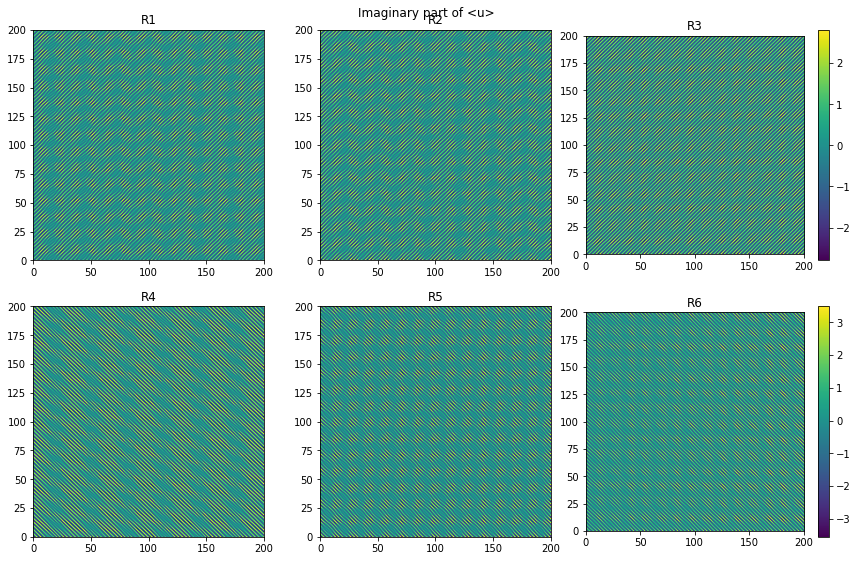

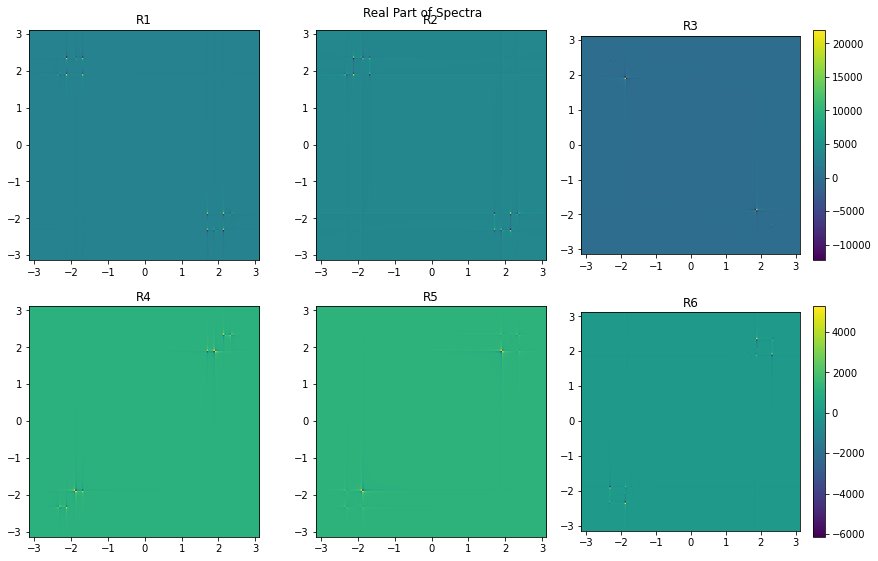

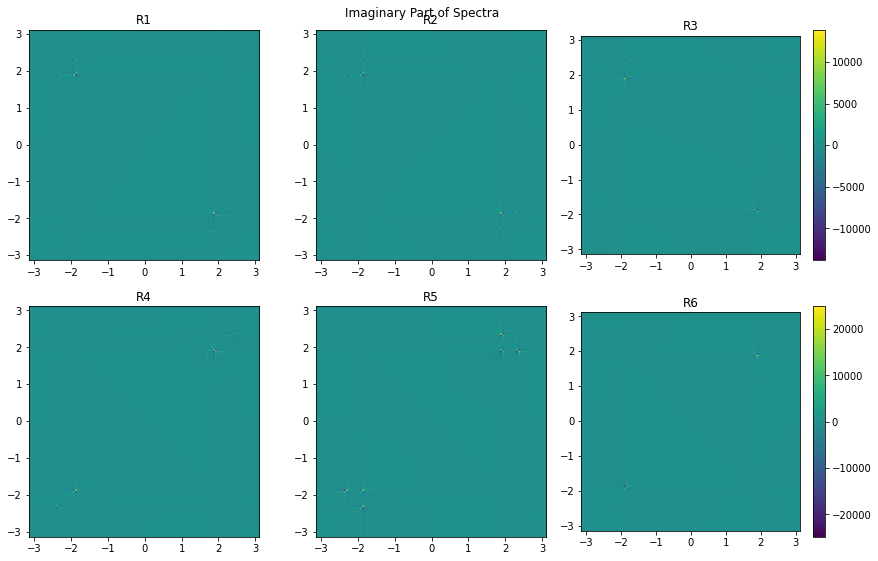

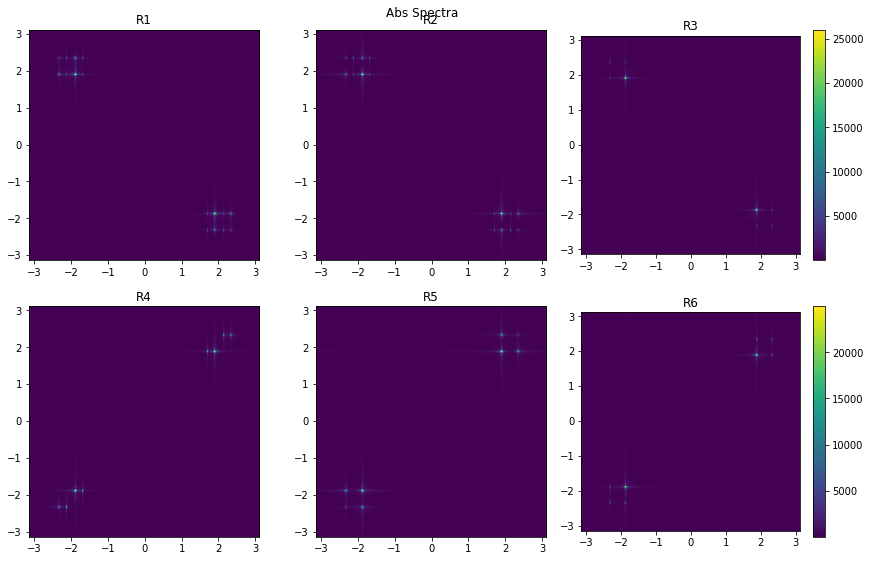

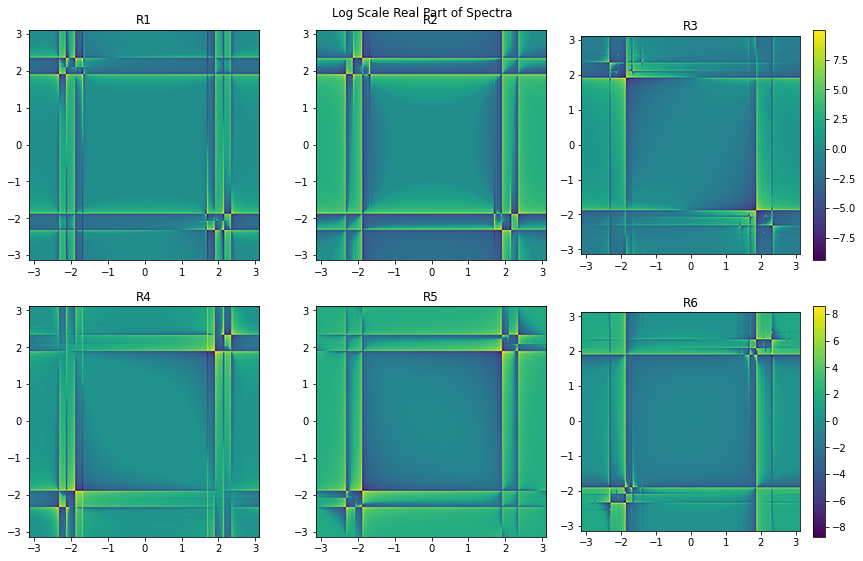

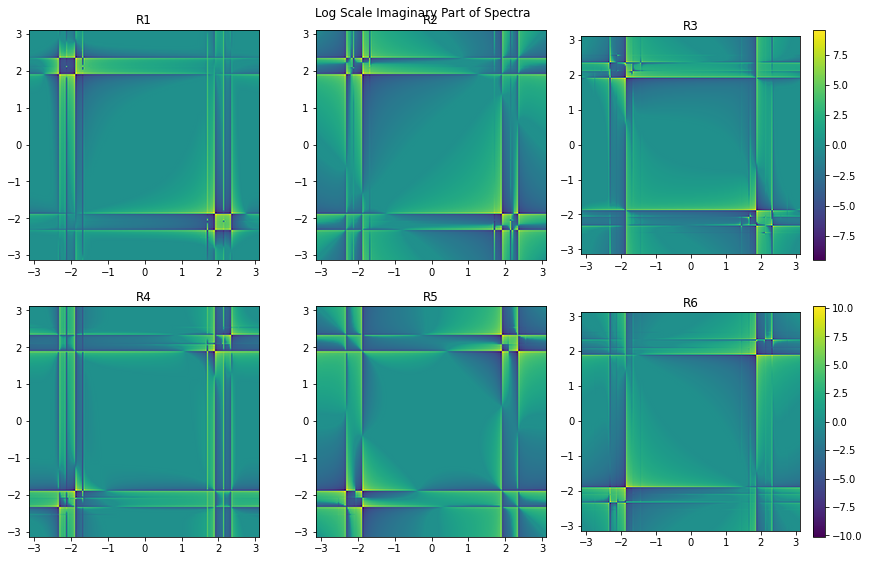

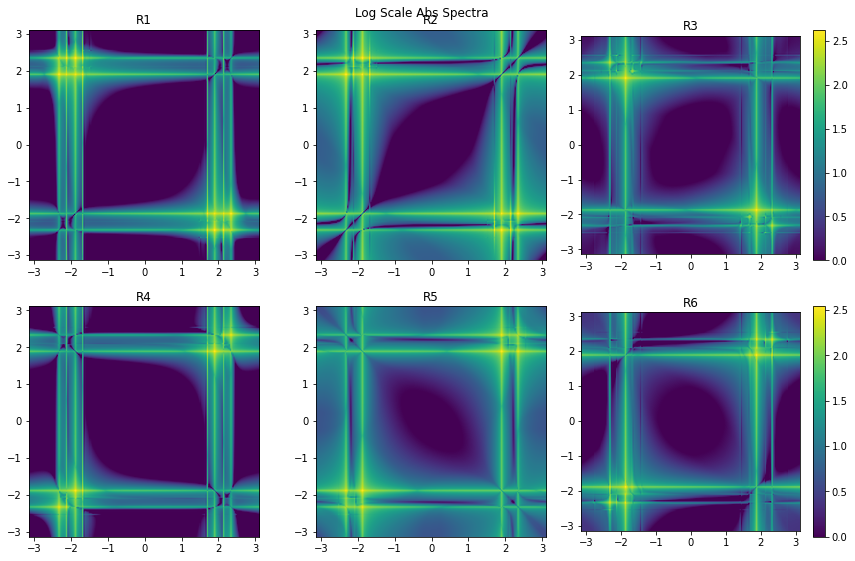

In [ ]:
statesR1_spano = spano.response2D(R1, tau1, tau2, tau3, r, True) #computing the states' evolution for double-sided diagram
statesR2_spano = spano.response2D(R2, tau1, tau2, tau3, r, True)
statesR3_spano = spano.response2D(R3, tau1, tau2, tau3, r, True)
statesR4_spano = spano.response2D(R4, tau1, tau2, tau3, r, True)
statesR5_spano = spano.response2D(R5, tau1, tau2, tau3, r, True)
statesR6_spano = spano.response2D(R6, tau1, tau2, tau3, r, True)
qsave(statesR1_spano, 'stateR1_r2_spano')
qsave(statesR2_spano, 'stateR2_r2_spano')
qsave(statesR3_spano, 'stateR3_r2_spano')
qsave(statesR4_spano, 'stateR4_r2_spano')
qsave(statesR5_spano, 'stateR5_r2_spano')
qsave(statesR6_spano, 'stateR6_r2_spano')

uuR1_spano = np.array([expect(spano.u, statesR1_spano[x][:]) for x in range(len(statesR1_spano))])
uuR2_spano = np.array([expect(spano.u, statesR2_spano[x][:]) for x in range(len(statesR2_spano))])
uuR3_spano = np.array([expect(spano.u, statesR3_spano[x][:]) for x in range(len(statesR3_spano))])
uuR4_spano = np.array([expect(spano.u, statesR4_spano[x][:]) for x in range(len(statesR4_spano))])
uuR5_spano = np.array([expect(spano.u, statesR5_spano[x][:]) for x in range(len(statesR5_spano))])
uuR6_spano = np.array([expect(spano.u, statesR6_spano[x][:]) for x in range(len(statesR6_spano))])
uu_list_spano = [uuR1_spano, uuR2_spano, uuR3_spano, uuR4_spano, uuR5_spano, uuR6_spano]
qsave(uuR1_spano, 'uuR1_r2_spano')
qsave(uuR2_spano, 'uuR2_r2_spano')
qsave(uuR3_spano, 'uuR3_r2_spano')
qsave(uuR4_spano, 'uuR4_r2_spano')
qsave(uuR5_spano, 'uuR5_r2_spano')
qsave(uuR6_spano, 'uuR6_r2_spano')
plotAll([u.imag for u in uu_list_spano], [t1, tau1, t1, tau3], title='Imaginary part of <u>')

specR1_spano = np.fft.fftshift(np.fft.fft2(uuR1_spano.imag))
specR2_spano = np.fft.fftshift(np.fft.fft2(uuR2_spano.imag))
specR3_spano = np.fft.fftshift(np.fft.fft2(uuR3_spano.imag))
specR4_spano = np.fft.fftshift(np.fft.fft2(uuR4_spano.imag))
specR5_spano = np.fft.fftshift(np.fft.fft2(uuR5_spano.imag))
specR6_spano = np.fft.fftshift(np.fft.fft2(uuR6_spano.imag))
spectra_list_spano = [specR1_spano,specR2_spano,specR3_spano,specR4_spano,specR5_spano,specR6_spano]

N1, N2 = np.shape(specR1_spano)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1_spano)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]
f1, f2 = np.meshgrid(freq1,freq2)

spectra_spano = np.array(spectra_list_spano)
plotAll(spectra_spano.real, extent, title='Real Part of Spectra')
plotAll(spectra_spano.imag, extent, title='Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, title='Abs Spectra')

# a log scale plot

plotAll(spectra_spano.real, extent, scale='log',title='Log Scale Real Part of Spectra')
plotAll(spectra_spano.imag, extent, scale='log',title='Log Scale Imaginary Part of Spectra')
plotAll(np.abs(spectra_spano), extent, scale='log',title='Log Scale Abs Spectra')

# No effect of anharmonicity on Spano Complex
it is understandable as the maximum manifold for spano hamiltonian is $|11\rangle$

However, we can test the effects of anharmonicty in a simple system

In [ ]:
sys2 = System(n=2) # defining a copy of system class with upto doubly excited manifold
V = -0.4
sys2.H = sys2.H
sys2.H

Quantum object: dims = [[3], [3]], shape = (3, 3), type = oper, isherm = True
Qobj data =
[[0. 0. 0.]
 [0. 2. 0.]
 [0. 0. 4.]]

appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards
appling first pulse at t1=0
evolve state after first pulse 
applying 2nd pulse and evolving the population for fixed time
applying 3rd pulse and evolving afterwards


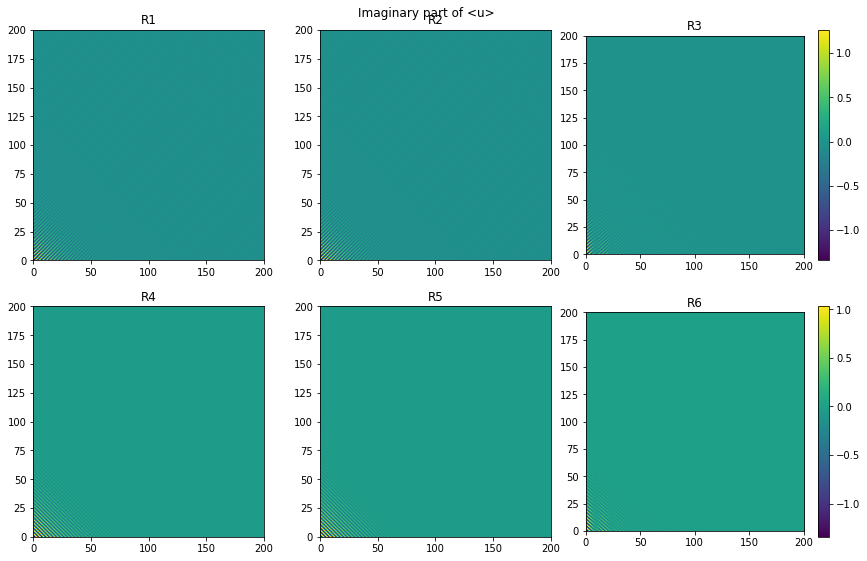

In [ ]:
sys2 = System(n=2) # defining a copy of system class with upto doubly excited manifold
V = -0.2
sys2.H = sys2.H+V*(sys2.a.dag()*sys2.a.dag()*sys2.a*sys2.a)
sys2.c_ops = [0.2*sys2.a, 0.2*sys2.a.dag()*sys2.a]
statesR1 = sys2.response2D(R1, tau1, tau2, tau3, r, True) #computing the states' evolution for double-sided diagram
statesR2 = sys2.response2D(R2, tau1, tau2, tau3, r, True)
statesR3 = sys2.response2D(R3, tau1, tau2, tau3, r, True)
statesR4 = sys2.response2D(R4, tau1, tau2, tau3, r, True)
statesR5 = sys2.response2D(R5, tau1, tau2, tau3, r, True)
statesR6 = sys2.response2D(R6, tau1, tau2, tau3, r, True)
uuR1 = np.array([expect(sys2.u, statesR1[x][:]) for x in range(len(statesR1))])
uuR2 = np.array([expect(sys2.u, statesR2[x][:]) for x in range(len(statesR2))])
uuR3 = np.array([expect(sys2.u, statesR3[x][:]) for x in range(len(statesR3))])
uuR4 = np.array([expect(sys2.u, statesR4[x][:]) for x in range(len(statesR4))])
uuR5 = np.array([expect(sys2.u, statesR5[x][:]) for x in range(len(statesR5))])
uuR6 = np.array([expect(sys2.u, statesR6[x][:]) for x in range(len(statesR6))])
uu_list = [uuR1, uuR2, uuR3, uuR4, uuR5, uuR6]
plotAll([u.imag for u in uu_list], [t1, tau1, t1, tau3], title='Imaginary part of <u>')



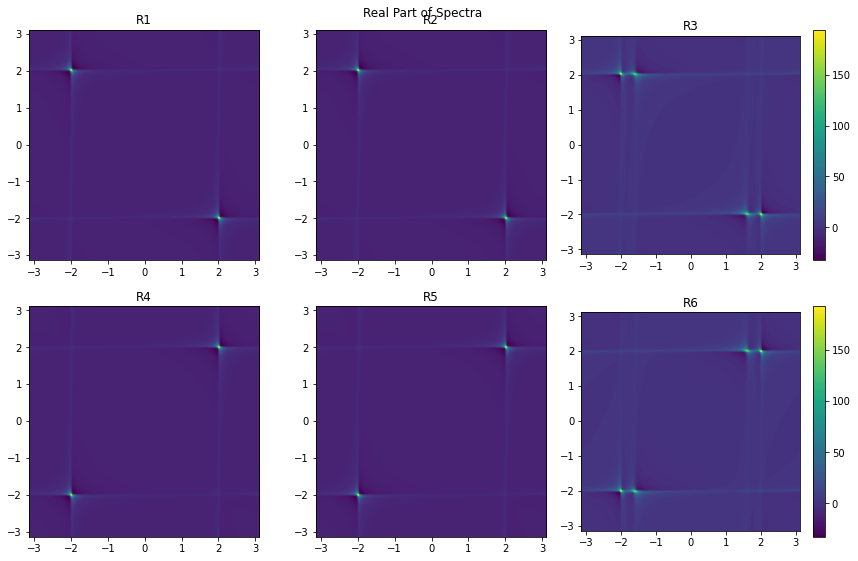

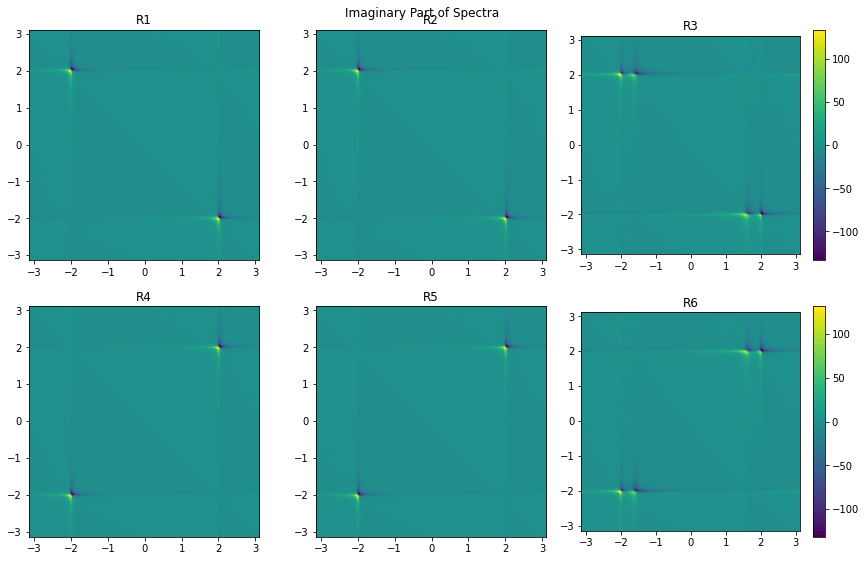

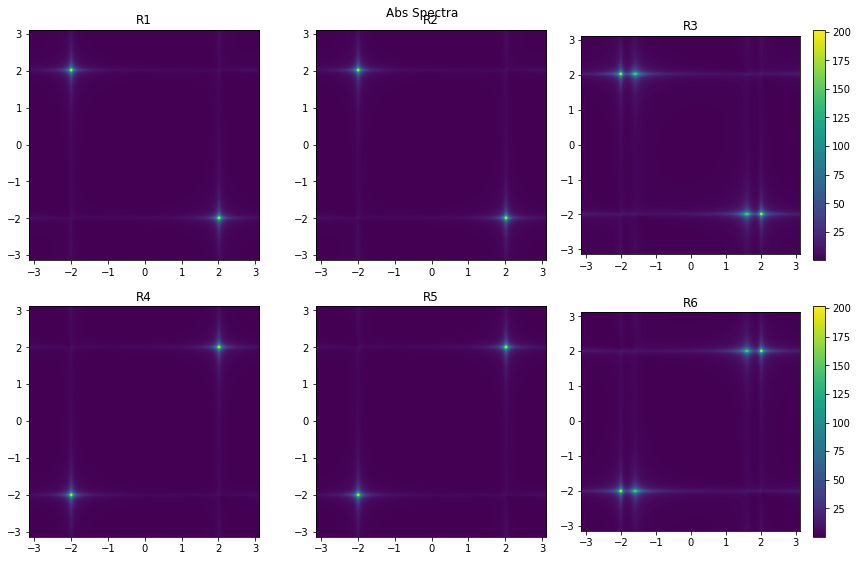

In [ ]:
specR1 = np.fft.fftshift(np.fft.fft2(uuR1.real))
specR2 = np.fft.fftshift(np.fft.fft2(uuR2.real))
specR3 = np.fft.fftshift(np.fft.fft2(uuR3.real))
specR4 = np.fft.fftshift(np.fft.fft2(uuR4.real))
specR5 = np.fft.fftshift(np.fft.fft2(uuR5.real))
specR6 = np.fft.fftshift(np.fft.fft2(uuR6.real))
spectra_list = [specR1,specR2,specR3,specR4,specR5,specR6]

N1, N2 = np.shape(specR1)
freq1 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1)[1],1/r))*2*np.pi #note the multiplication with 2pi is 
freq2 = np.fft.fftshift(np.fft.fftfreq(np.shape(uuR1)[0], 1/r))*2*np.pi# because fft works with f and qutip with w.
extent=[min(freq1), max(freq1), min(freq2), max(freq2)]


spectra = np.array(spectra_list)
plotAll(spectra.real, extent, title='Real Part of Spectra')
plotAll(spectra.imag, extent, title='Imaginary Part of Spectra')
plotAll(np.abs(spectra), extent, title='Abs Spectra')

# a log scale plot

#plotAll(spectra.real, extent, scale='log',title='Log Scale Real Part of Spectra')
#plotAll(spectra.imag, extent, scale='log',title='Log Scale Imaginary Part of Spectra')
#plotAll(np.abs(spectra), extent, scale='log',title='Log Scale Abs Spectra')

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:

img = specR1.real
fig = px.imshow(img, labels=dict(x="$\omega_3$", y="$\omega_1$", color="Signal"),
                x=freq1,
                y=freq2, origin='lower')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Contour(z=img,x=freq1, y=freq2,contours=dict(start=0, end=150, size=15, coloring='fill'), dx=0.2, x0=-3, dy=0.2, y0=-3,))
fig.show()

# NL spectroscopy of a model microcavity system

In this section we want to formulate how to use this approach to model the optical response of a microcavity systems. 
For this, we shall place a molecular hamiltonain in contact with quantized cavity mode. The perturbation with the external laser field will then be with respect to excitations of the cavity.  In the simplest case, the model is simply a single mode oscillator. 

